
<div class="alert alert-info" style="background-color:#5d3a8e; color:white; padding:0px 10px; border-radius:5px;"><h2 style='margin:10px 5px'> Mission</h2>
</div>


- Réaliser un algorithme de détection de la race du chien sur une photo.
-  Pré-processer des images avec des techniques spécifiques (e.g. whitening, equalization, éventuellement modification de la taille des images) et de réaliser de la data augmentation (mirroring, cropping...).
-  Mettre en œuvre deux approches s’appuyant sur l’état de l’art et l’utilisation de CNN (réseaux de neurones convolutionnels)

<div class="alert alert-info" style="background-color:#5d3a8e; color:white; padding:0px 10px; border-radius:5px;"><h2 style='margin:10px 5px'> Les données</h2>
</div>
 
- Stanford Dogs Dataset.

<div class="alert alert-info" style="background-color:#5d3a8e; color:white; padding:0px 10px; border-radius:5px;"><h2 style='margin:10px 5px'> Contraintes</h2>
</div>

- Réalisation d'un réseau CNN, avec une optimisation de certains hyperparamètres (des layers du modèle, de la compilation du modèle et de l’exécution du modèle).
- L'utilisation du transfer learning, c’est-à-dire en utilisant un réseau déjà entraîné, et en le modifiant pour répondre à notre problème.


<div class="alert alert-info" style="background-color:#5d3a8e; color:white; padding:0px 10px; border-radius:5px;"><h2 style='margin:10px 5px'> Load the Data set</h2>
</div>

In [1]:
import os
import random
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import os
import cv2 as cv
import itertools
import re
import requests
import cv2
import shutil
import pickle
import datetime
import scipy as sp
from scipy import linalg
from skimage import img_as_ubyte
import matplotlib.image as mpimg
from xml.etree import cElementTree as ElementTree
import xml.etree.ElementTree as ET # for parsing XML
import matplotlib.pyplot as plt # to show images
from PIL import Image # to read images

import tensorflow as tf
from tensorflow.keras.layers import concatenate
from tensorflow.keras.layers import Conv2D, SeparableConv2D
from tensorflow.keras.layers import Flatten, Dense, Activation
from tensorflow.keras.layers import BatchNormalization, Dropout
from tensorflow.keras.layers import MaxPooling2D, AveragePooling2D
from tensorflow.keras.layers import GlobalMaxPooling2D, GlobalAveragePooling2D
from tensorflow.python.client import device_lib
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.preprocessing.image import load_img, img_to_array
from tensorflow.keras.callbacks import TensorBoard, ReduceLROnPlateau, EarlyStopping


from tensorflow.keras import layers
from tensorflow.keras import initializers
from keras.models import Sequential, Input, Model 
from keras.layers import Dense, Dropout, Flatten, Activation 
from keras.layers import Conv2D , MaxPooling2D
from keras.layers.normalization import BatchNormalization 
from keras.layers.advanced_activations import LeakyReLU
from keras.optimizers import RMSprop
from keras.callbacks import History, ModelCheckpoint, EarlyStopping


import keras
from sklearn.metrics import confusion_matrix,  multilabel_confusion_matrix
from keras.models import Sequential
from keras.layers import Conv2D, Dense, Flatten, MaxPooling2D
from keras.layers import BatchNormalization, Activation, Dropout
from keras.preprocessing.image import ImageDataGenerator
from keras.callbacks import ModelCheckpoint
import model_evaluation_utils as meu
import glob
import warnings
warnings.filterwarnings('ignore')



# Seed value
# Apparently you may use different seed values at each stage
seed_value= 0

# 1. Set the `PYTHONHASHSEED` environment variable at a fixed value
import os
os.environ['PYTHONHASHSEED']=str(seed_value)

# 2. Set the `python` built-in pseudo-random generator at a fixed value
import random
random.seed(seed_value)

# 3. Set the `numpy` pseudo-random generator at a fixed value
import numpy as np
np.random.seed(seed_value)

# 4. Set the `tensorflow` pseudo-random generator at a fixed value
import tensorflow as tf
#tf.random.set_seed(seed_value)
# for later versions: 
tf.compat.v1.set_random_seed(seed_value)

# 5. Configure a new global `tensorflow` session
from keras import backend as K
#session_conf = tf.ConfigProto(intra_op_parallelism_threads=1, inter_op_parallelism_threads=1)
#sess = tf.Session(graph=tf.get_default_graph(), config=session_conf)
#K.set_session(sess)
# for later versions:
session_conf = tf.compat.v1.ConfigProto(intra_op_parallelism_threads=1, inter_op_parallelism_threads=1)
sess = tf.compat.v1.Session(graph=tf.compat.v1.get_default_graph(), config=session_conf)
tf.compat.v1.keras.backend.set_session(sess)

Using TensorFlow backend.


In [2]:
root_images = 'C:/Users/PC/python/OpenClassrooms/Projet6/Images'  # Images folder
root_annotation = 'C:/Users/PC/python/OpenClassrooms/Projet6/Annotation/' # Annotation xml folder
root_data= 'C:/Users/PC/python/OpenClassrooms/Projet6/Data/'
root_data_10= 'C:/Users/PC/python/OpenClassrooms/Projet6/Data_10_Folder/'



In [3]:
# Get all paths
data_dir_list= os.listdir(root_images)
print(data_dir_list)
path, dirs, files= next(os.walk(root_images))
file_count= len(files)

['n02085620-Chihuahua', 'n02085782-Japanese_spaniel', 'n02085936-Maltese_dog', 'n02086079-Pekinese', 'n02086240-Shih-Tzu', 'n02086646-Blenheim_spaniel', 'n02086910-papillon', 'n02087046-toy_terrier', 'n02087394-Rhodesian_ridgeback', 'n02088094-Afghan_hound', 'n02088238-basset', 'n02088364-beagle', 'n02088466-bloodhound', 'n02088632-bluetick', 'n02089078-black-and-tan_coonhound', 'n02089867-Walker_hound', 'n02089973-English_foxhound', 'n02090379-redbone', 'n02090622-borzoi', 'n02090721-Irish_wolfhound', 'n02091032-Italian_greyhound', 'n02091134-whippet', 'n02091244-Ibizan_hound', 'n02091467-Norwegian_elkhound', 'n02091635-otterhound', 'n02091831-Saluki', 'n02092002-Scottish_deerhound', 'n02092339-Weimaraner', 'n02093256-Staffordshire_bullterrier', 'n02093428-American_Staffordshire_terrier', 'n02093647-Bedlington_terrier', 'n02093754-Border_terrier', 'n02093859-Kerry_blue_terrier', 'n02093991-Irish_terrier', 'n02094114-Norfolk_terrier', 'n02094258-Norwich_terrier', 'n02094433-Yorkshire_t

In [262]:
original_dataset_dir= root_images
base_dir= 'C:/Users/PC/python/OpenClassrooms/Projet6/image_crop_Folder'
os.mkdir(base_dir)

In [263]:
for i in data_dir_list:
    
    # Under train folder we create 120 folders 
    folder= str(i) +"_dir" 
    folder = os.path.join(base_dir, str(i))
    os.mkdir(folder)

In [249]:
all_images=glob.glob(root_images+ '/*')
Images= []
for i in all_images:
    Images+=glob.glob(i+ "/*")
print(f"Total images : {len(Images)}")

breeds = glob.glob(root_annotation+ '\*')
annotation=[]
for b in breeds:
    annotation+=glob.glob(b+"\*")
print(f"Total annotation : {len(annotation)}")

breed_map={}
for annot in annotation:
    breed=annot.split("/")[-1]
    breed=breed.split("\\")[-2] +'/'+ breed.split("\\")[-1]
    #print(breed)
    index=breed.split("/")[0]
    #print(index)
    breed_map.setdefault(index,breed)
    
print(f"Total Breeds : {len(breed_map)}")

Total images : 20580
Total annotation : 20580
Total Breeds : 120


In [250]:
def save_obj(obj, name):
    with open(root_data + name + '.pkl', 'wb') as f:
        pickle.dump(obj, f, pickle.HIGHEST_PROTOCOL)

def load_obj(name):
    with open(root_data + name + '.pkl', 'rb') as f:
        return pickle.load(f)

In [251]:
class XmlListConfig(list):
    def __init__(self, aList):
        for element in aList:
            if element:
                # treat like dict
                if len(element) == 1 or element[0].tag != element[1].tag:
                    self.append(XmlDictConfig(element))
                # treat like list
                elif element[0].tag == element[1].tag:
                    self.append(XmlListConfig(element))
            elif element.text:
                text = element.text.strip()
                if text:
                    self.append(text)


class XmlDictConfig(dict):
    '''
    Example usage:

    >>> tree = ElementTree.parse('your_file.xml')
    >>> root = tree.getroot()
    >>> xmldict = XmlDictConfig(root)

    Or, if you want to use an XML string:

    >>> root = ElementTree.XML(xml_string)
    >>> xmldict = XmlDictConfig(root)

    And then use xmldict for what it is... a dict.
    '''
    def __init__(self, parent_element):
        if parent_element.items():
            self.update(dict(parent_element.items()))
        for element in parent_element:
            if element:
                # treat like dict - we assume that if the first two tags
                # in a series are different, then they are all different.
                if len(element) == 1 or element[0].tag != element[1].tag:
                    aDict = XmlDictConfig(element)
                # treat like list - we assume that if the first two tags
                # in a series are the same, then the rest are the same.
                else:
                    # here, we put the list in dictionary; the key is the
                    # tag name the list elements all share in common, and
                    # the value is the list itself 
                    aDict = {element[0].tag: XmlListConfig(element)}
                # if the tag has attributes, add those to the dict
                if element.items():
                    aDict.update(dict(element.items()))
                self.update({element.tag: aDict})
            # this assumes that if you've got an attribute in a tag,
            # you won't be having any text. This may or may not be a 
            # good idea -- time will tell. It works for the way we are
            # currently doing XML configuration files...
            elif element.items():
                self.update({element.tag: dict(element.items())})
            # finally, if there are no child tags and no attributes, extract
            # the text
            else:
                self.update({element.tag: element.text})

In [252]:
directory_annotation_names = [x[0] for x in os.walk(root_annotation)][1:]
#directory_annotation_names

In [253]:
image_path = []
filename=[]
categories = []
widths = []
heights = []
image_cropped=[]
#bbox=[]
xmin=[]
xmax=[]
ymin=[]
ymax=[]
count = 0
for dir_an_name in directory_annotation_names:
    directory = dir_an_name.split('/')[-1]
   # print(directory)
    filenames_dir = os.listdir(dir_an_name)
    #print(filenames_dir)
    for filename_dir in filenames_dir:
        xml_string = open(root_annotation + "/" + directory + "/" + filename_dir, "r+").read()
        #print(xml_string)
        root_xml = ElementTree.XML(xml_string)
        #print(root_xml)
        xmldict = XmlDictConfig(root_xml)
        #print(xmldict)
        if os.path.isfile(root_images + "/" + directory + "/" + filename_dir + ".jpg"): 
            filename.append(filename_dir + ".jpg")
            image_path.append(root_images + "/" + directory + "/" + filename_dir + ".jpg")
            image_cropped.append(base_dir+ "/" + directory + "/" + filename_dir + ".jpg")

            categories.append(xmldict['object']['name'])
            widths.append(xmldict['size']['width'])
            heights.append(xmldict['size']['height'])
            #bndbox.append(xmldict['object']['bndbox'])

            xmin.append(xmldict['object']['bndbox']['xmin'])
            
            xmax.append(xmldict['object']['bndbox']['xmax'])
            ymin.append( xmldict['object']['bndbox']['ymin'])
            ymax.append( xmldict['object']['bndbox']['ymax'])
            #all_lst=[xmin, xmax, ymin, ymax]  
            #print(all_lst)
            #bbox.append(all_lst)              

        else:
            count += 1



In [254]:
data = pd.DataFrame({
    'filename': filename,
    'image_path': image_path,
    'cropped_path': image_cropped,
    'widths': widths,
    'heights': heights,
    'xmin': xmin,
    'xmax':xmax,
    'ymin':ymin,
    'ymax':ymax,
    'category': categories
})

data

,filename,image_path,cropped_path,widths,heights,xmin,xmax,ymin,ymax,category
0,n02085620_10074.jpg,C:/Users/PC/python/OpenClassrooms/Projet6/Imag...,C:/Users/PC/python/OpenClassrooms/Projet6/imag...,333,500,25,276,10,498,Chihuahua
1,n02085620_10131.jpg,C:/Users/PC/python/OpenClassrooms/Projet6/Imag...,C:/Users/PC/python/OpenClassrooms/Projet6/imag...,395,495,49,393,9,493,Chihuahua
2,n02085620_10621.jpg,C:/Users/PC/python/OpenClassrooms/Projet6/Imag...,C:/Users/PC/python/OpenClassrooms/Projet6/imag...,500,298,142,335,43,250,Chihuahua
3,n02085620_1073.jpg,C:/Users/PC/python/OpenClassrooms/Projet6/Imag...,C:/Users/PC/python/OpenClassrooms/Projet6/imag...,345,500,0,312,27,498,Chihuahua
4,n02085620_10976.jpg,C:/Users/PC/python/OpenClassrooms/Projet6/Imag...,C:/Users/PC/python/OpenClassrooms/Projet6/imag...,322,484,90,242,104,452,Chihuahua
...,...,...,...,...,...,...,...,...,...,...
20575,n02116738_9798.jpg,C:/Users/PC/python/OpenClassrooms/Projet6/Imag...,C:/Users/PC/python/OpenClassrooms/Projet6/imag...,500,375,8,499,14,349,African_hunting_dog
20576,n02116738_9818.jpg,C:/Users/PC/python/OpenClassrooms/Projet6/Imag...,C:/Users/PC/python/OpenClassrooms/Projet6/imag...,500,333,48,499,0,332,African_hunting_dog
20577,n02116738_9829.jpg,C:/Users/PC/python/OpenClassrooms/Projet6/Imag...,C:/Users/PC/python/OpenClassrooms/Projet6/imag...,202,300,0,170,39,299,African_hunting_dog
20578,n02116738_9844.jpg,C:/Users/PC/python/OpenClassrooms/Projet6/Imag...,C:/Users/PC/python/OpenClassrooms/Projet6/imag...,600,400,235,539,140,334,African_hunting_dog


In [255]:
data.set_index('filename')

,image_path,cropped_path,widths,heights,xmin,xmax,ymin,ymax,category
filename,,,,,,,,,
n02085620_10074.jpg,C:/Users/PC/python/OpenClassrooms/Projet6/Imag...,C:/Users/PC/python/OpenClassrooms/Projet6/imag...,333,500,25,276,10,498,Chihuahua
n02085620_10131.jpg,C:/Users/PC/python/OpenClassrooms/Projet6/Imag...,C:/Users/PC/python/OpenClassrooms/Projet6/imag...,395,495,49,393,9,493,Chihuahua
n02085620_10621.jpg,C:/Users/PC/python/OpenClassrooms/Projet6/Imag...,C:/Users/PC/python/OpenClassrooms/Projet6/imag...,500,298,142,335,43,250,Chihuahua
n02085620_1073.jpg,C:/Users/PC/python/OpenClassrooms/Projet6/Imag...,C:/Users/PC/python/OpenClassrooms/Projet6/imag...,345,500,0,312,27,498,Chihuahua
n02085620_10976.jpg,C:/Users/PC/python/OpenClassrooms/Projet6/Imag...,C:/Users/PC/python/OpenClassrooms/Projet6/imag...,322,484,90,242,104,452,Chihuahua
...,...,...,...,...,...,...,...,...,...
n02116738_9798.jpg,C:/Users/PC/python/OpenClassrooms/Projet6/Imag...,C:/Users/PC/python/OpenClassrooms/Projet6/imag...,500,375,8,499,14,349,African_hunting_dog
n02116738_9818.jpg,C:/Users/PC/python/OpenClassrooms/Projet6/Imag...,C:/Users/PC/python/OpenClassrooms/Projet6/imag...,500,333,48,499,0,332,African_hunting_dog
n02116738_9829.jpg,C:/Users/PC/python/OpenClassrooms/Projet6/Imag...,C:/Users/PC/python/OpenClassrooms/Projet6/imag...,202,300,0,170,39,299,African_hunting_dog


In [256]:
print('We have {} images and {} classes'.format(data.shape[0], len(data['category'].unique())))

We have 20580 images and 120 classes


In [257]:
data['category'].value_counts().head(10)

Maltese_dog             252
Afghan_hound            239
Scottish_deerhound      232
Pomeranian              219
Bernese_mountain_dog    218
Samoyed                 218
Irish_wolfhound         218
Shih-Tzu                214
Great_Pyrenees          213
Leonberg                210
Name: category, dtype: int64

<AxesSubplot:>

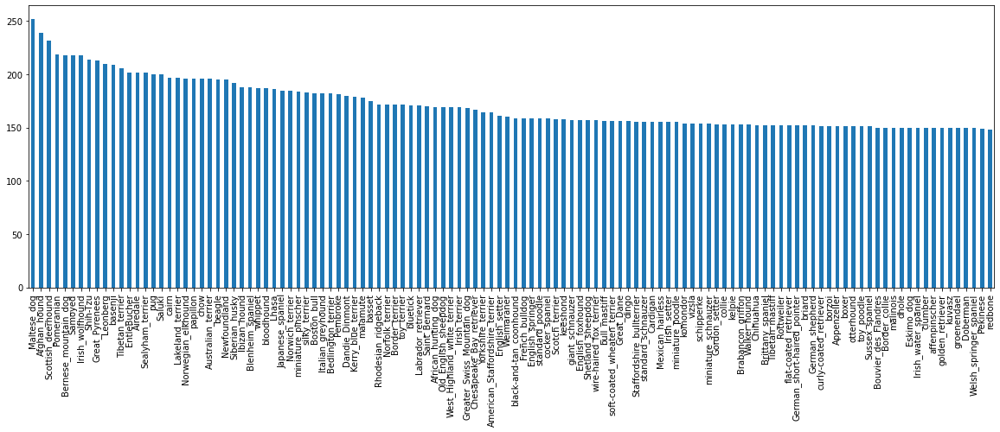

In [258]:
plt.figure(figsize=(20, 6))
data['category'].value_counts().plot.bar()

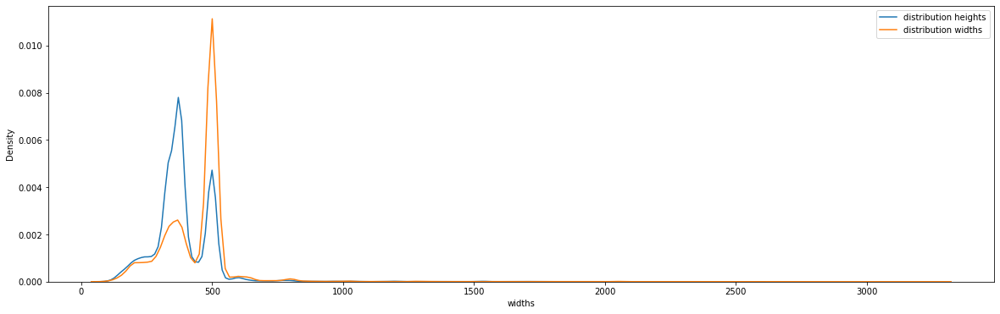

In [232]:
plt.figure(figsize=(20, 6))
sns.distplot(data['heights'], hist=False, label="distribution heights")
sns.distplot(data['widths'], hist=False, label="distribution widths")
plt.legend()

In [ ]:
#fig, axes = plt.subplots(nrows=4, ncols=5, figsize=(15, 15),
#                        subplot_kw={'xticks': [], 'yticks': []})

#for i, ax in enumerate(axes.flat):
 #   ax.imshow(plt.imread(data.image_path[i]))
  #  ax.set_title(data.category[i])
#plt.tight_layout()
#plt.show()


<div class="alert alert-info" style="background-color:#5d3a8e; color:white; padding:0px 10px; border-radius:5px;"><h2 style='margin:10px 5px'> Crop the images </h2>
</div>

In [259]:
# Image before cropping 
img_width=256; img_height=256
batch_size=16
channels = 3
num_images= 50
def get_images(image_dir):

    image_index = 0
    image_arr_size= img_width * img_height * channels
    images = np.ndarray(shape=(num_images, image_arr_size))
    labels = np.array([])                       

    
    for type in os.listdir(image_dir)[:50]:
        
        type_images = os.listdir(image_dir + type)
        labels= np.append(labels, type.split('-')[1])
        for image in type_images[:1]:
            image_file = os.path.join(image_dir, type + '/', image)
            image_data = mpimg.imread(image_file)
            image_resized = resize(image_data, (img_width, img_height), anti_aliasing=True)

            images[image_index, :] = image_resized.flatten()
            print (type, ':', image)
            image_index += 1

    return (images, labels)

In [260]:
def plot_images(instances, images_per_row=10, **options):
    size = img_width
    images_per_row = min(len(instances), images_per_row)
    images = [instance.reshape(img_width, img_height, channels) for instance in instances]
    n_rows = (len(instances) - 1) // images_per_row + 1
    row_images = []
    n_empty = n_rows * images_per_row - len(instances)
    images.append(np.zeros((img_width, img_height * n_empty)))
    for row in range(n_rows):
        if (row == len(instances)/images_per_row):
            break
        rimages = images[row * images_per_row : (row + 1) * images_per_row]
        row_images.append(np.concatenate(rimages, axis=1))
    image = np.concatenate(row_images, axis=0)
    plt.figure(figsize=(20,20))
    plt.imshow(image, **options)
    plt.axis("off")
    plt.savefig('dogs_images.png', transparent= True, bbox_inches= 'tight', dpi= 900)
    plt.show()

n02085620-Chihuahua : n02085620_10074.jpg
n02085782-Japanese_spaniel : n02085782_1039.jpg
n02085936-Maltese_dog : n02085936_10073.jpg
n02086079-Pekinese : n02086079_10059.jpg
n02086240-Shih-Tzu : n02086240_1011.jpg
n02086646-Blenheim_spaniel : n02086646_1002.jpg
n02086910-papillon : n02086910_10147.jpg
n02087046-toy_terrier : n02087046_1004.jpg
n02087394-Rhodesian_ridgeback : n02087394_10014.jpg
n02088094-Afghan_hound : n02088094_1003.jpg
n02088238-basset : n02088238_10005.jpg
n02088364-beagle : n02088364_10108.jpg
n02088466-bloodhound : n02088466_10083.jpg
n02088632-bluetick : n02088632_101.jpg
n02089078-black-and-tan_coonhound : n02089078_1021.jpg
n02089867-Walker_hound : n02089867_1029.jpg
n02089973-English_foxhound : n02089973_1.jpg
n02090379-redbone : n02090379_1006.jpg
n02090622-borzoi : n02090622_10281.jpg
n02090721-Irish_wolfhound : n02090721_1002.jpg
n02091032-Italian_greyhound : n02091032_10079.jpg
n02091134-whippet : n02091134_10107.jpg
n02091244-Ibizan_hound : n02091244_100

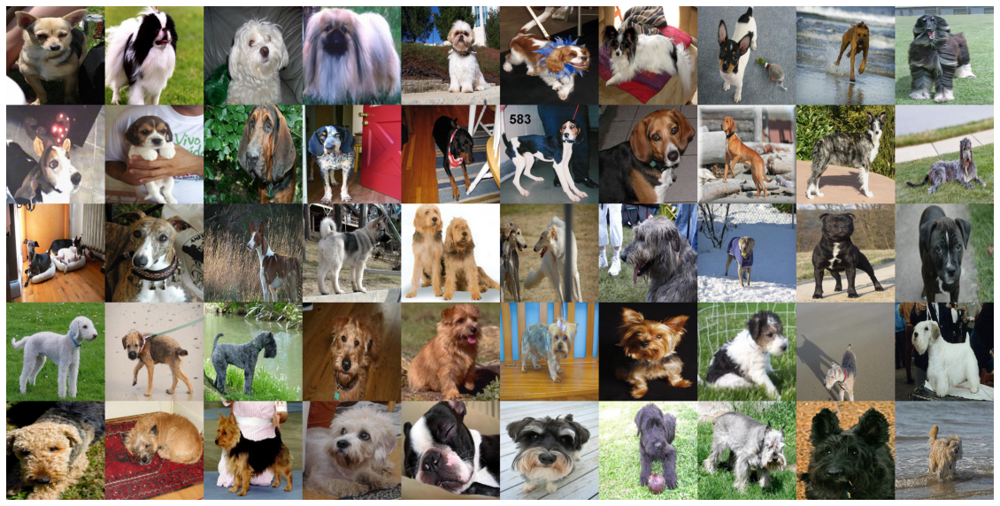

In [261]:
from skimage.transform import resize
images, labels = get_images(root_images+ '/')
plot_images(images)


In [264]:
# After cropping 
for i in data.index: 
    image_path= data['image_path'][i]
    croped_path=data['cropped_path'][i]
    #print(image_path)
    img = Image.open(image_path)
    xmin= data['xmin'][i]
    xmax= data['xmax'][i]
    ymin= data['ymin'][i]
    ymax= data['ymax'][i]
    #print(xmin, xmax, ymin, ymax)
    crop_img = img.crop((int(xmin) ,int(ymin) ,int(xmax) ,int(ymax)))
    newsize = (224, 224) 
    im1 = crop_img.resize(newsize)
   # plt.imshow(im1) 
    im = im1.convert('RGB')
    im.save(os.path.join(croped_path))
   # im1.save(os.path.join(image_path))

n02085620-Chihuahua : n02085620_10074.jpg
n02085782-Japanese_spaniel : n02085782_1039.jpg
n02085936-Maltese_dog : n02085936_10073.jpg
n02086079-Pekinese : n02086079_10059.jpg
n02086240-Shih-Tzu : n02086240_1011.jpg
n02086646-Blenheim_spaniel : n02086646_1002.jpg
n02086910-papillon : n02086910_10147.jpg
n02087046-toy_terrier : n02087046_1004.jpg
n02087394-Rhodesian_ridgeback : n02087394_10014.jpg
n02088094-Afghan_hound : n02088094_1003.jpg
n02088238-basset : n02088238_10005.jpg
n02088364-beagle : n02088364_10108.jpg
n02088466-bloodhound : n02088466_10083.jpg
n02088632-bluetick : n02088632_101.jpg
n02089078-black-and-tan_coonhound : n02089078_1021.jpg
n02089867-Walker_hound : n02089867_1029.jpg
n02089973-English_foxhound : n02089973_1.jpg
n02090379-redbone : n02090379_1006.jpg
n02090622-borzoi : n02090622_10281.jpg
n02090721-Irish_wolfhound : n02090721_1002.jpg
n02091032-Italian_greyhound : n02091032_10079.jpg
n02091134-whippet : n02091134_10107.jpg
n02091244-Ibizan_hound : n02091244_100

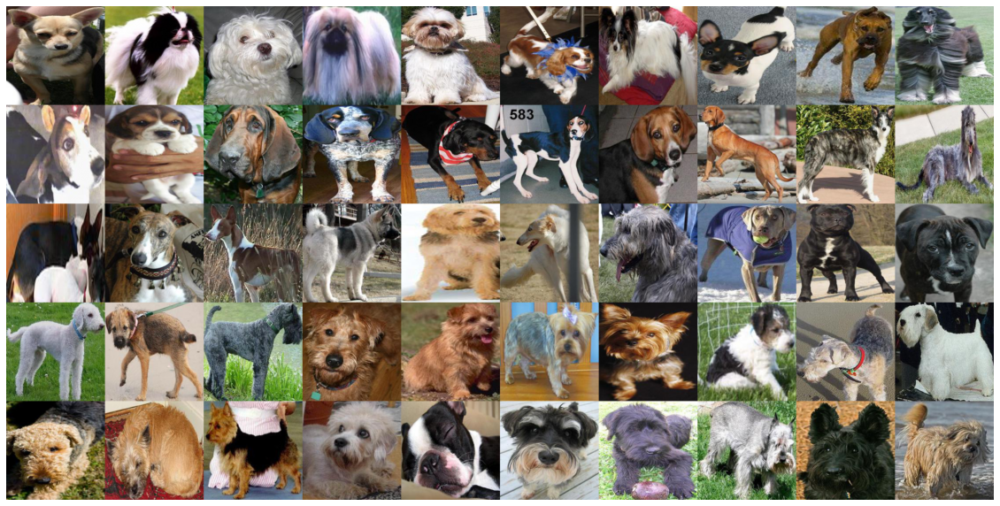

In [265]:
from skimage.transform import resize
images, labels = get_images(base_dir+ '/')
plot_images(images)

<div class="alert alert-info" style="background-color:#5d3a8e; color:white; padding:0px 10px; border-radius:5px;"><h2 style='margin:10px 5px'> The Datasets </h2>
</div>

In [91]:
cropped_dataset_dir= base_dir

data_Folder= 'C:/Users/PC/python/OpenClassrooms/Projet6/data_Folder'
os.mkdir(data_Folder)

In [92]:
# Create two folders (train and validation)
train_dir= os.path.join(data_Folder, 'train')
os.mkdir(train_dir)

validation_dir= os.path.join(data_Folder, 'validation')
os.mkdir(validation_dir)

test_dir= os.path.join(data_Folder, 'test')
os.mkdir(test_dir)


train_valid_dir= os.path.join(data_Folder, 'train_valid')
os.mkdir(train_valid_dir)

In [93]:
for i in data_dir_list:
    
    # Under train folder we create 120 folders 
    folder= "trainvalid_"+ str(i) +"_dir" 
    folder = os.path.join(train_valid_dir, str(i))
    os.mkdir(folder)

In [94]:
for i in data_dir_list:
    
    # Under train folder we create 120 folders 
    folder= "train_"+ str(i) +"_dir" 
    folder = os.path.join(train_dir, str(i))
    os.mkdir(folder)

In [95]:
for i in data_dir_list:
    
    # Under train folder we create 120 folders 
    folder= "test_"+ str(i) +"_dir" 
    folder = os.path.join(test_dir, str(i))
    os.mkdir(folder)

In [96]:
for i in data_dir_list:
    
    # Under train folder we create 120 folders 
    folder= "validation_"+ str(i) +"_dir" 
    folder = os.path.join(validation_dir, str(i))
    os.mkdir(folder)

In [97]:
import os
import random
from shutil import copyfile

def split_data(SOURCE, TRAINING, VALIDATION, SPLIT_SIZE):
    files = []
    for filename in os.listdir(SOURCE):
        file = SOURCE + filename
        if os.path.getsize(file) > 0:
            files.append(filename)
        else:
            print(filename + " is zero length, so ignoring.")

    training_length = int(len(files) * SPLIT_SIZE)
    valid_length = int(len(files) - training_length)
    shuffled_set = random.sample(files, len(files))
    training_set = shuffled_set[0:training_length]
    valid_set = shuffled_set[training_length:]

    for filename in training_set:
        this_file = SOURCE + filename
        destination = TRAINING + filename
        copyfile(this_file, destination)

    for filename in valid_set:
        this_file = SOURCE + filename
        destination = VALIDATION + filename
        copyfile(this_file, destination)

In [98]:
split_size = .95
for i in data_dir_list:
    DIR_SOURCE =  'DIR_SOURCE'+'_'+str(i)
    DIR_SOURCE =  os.path.join(cropped_dataset_dir + "/" , str(i)+ "/") 
    TRANINGVALID_DIR =  'TRANINGVALID_DIR'+'_'+str(i)
    TRANINGVALID_DIR= os.path.join(train_valid_dir +"/", str(i)+ "/")
    TEST_DIR =  'Test_DIR'+'_'+str(i)
    TEST_DIR=  os.path.join(test_dir + "/" , str(i)+ "/")
    split_data(DIR_SOURCE, TRANINGVALID_DIR, TEST_DIR, split_size)


In [99]:
split_size = .80
for i in data_dir_list:
    DIR_SOURCE =  'DIR_SOURCE'+'_'+str(i)
    DIR_SOURCE =  os.path.join(train_valid_dir + "/" , str(i)+ "/") 
    TRANING_DIR =  'TRANING_DIR'+'_'+str(i)
    TRANING_DIR= os.path.join(train_dir +"/", str(i)+ "/")
    VALID_DIR =  'VALIDATION_DIR'+'_'+str(i)
    VALID_DIR=  os.path.join(validation_dir + "/" , str(i)+ "/")
    split_data(DIR_SOURCE, TRANING_DIR, VALID_DIR, split_size)

In [5]:
test_dir= r'C:\Users\PC\python\OpenClassrooms\Projet6\data_Folder/test'
train_dir= r'C:\Users\PC\python\OpenClassrooms\Projet6\data_Folder/train'
valid_dir= r'C:\Users\PC\python\OpenClassrooms\Projet6\data_Folder/validation'

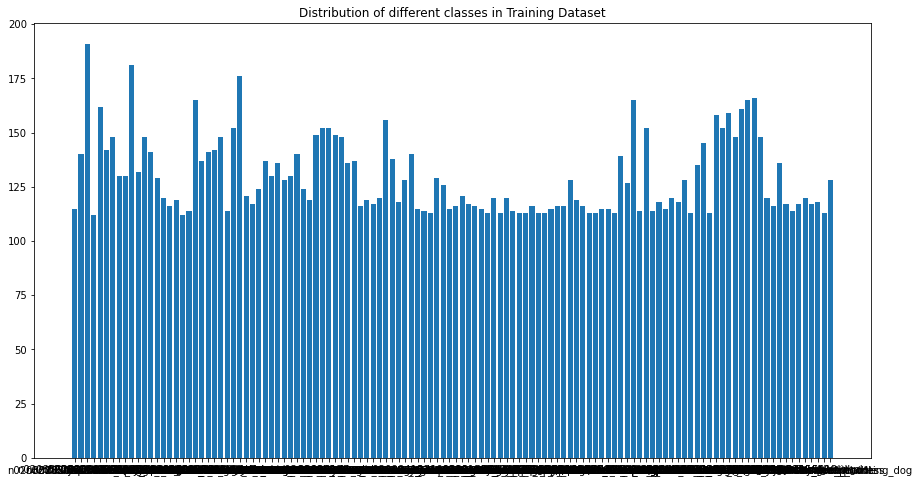

In [1012]:
import matplotlib.pyplot as plt
import seaborn as sns
from matplotlib.image import imread
import pathlib

image_folder = data_dir_list[:]
nimgs = {}
for i in image_folder:
    nimages = len(os.listdir(train_dir+ '/'+i+'/'))
    nimgs[i]=nimages
plt.figure(figsize=(15, 8))
plt.bar(range(len(nimgs)), list(nimgs.values()), align='center')
plt.xticks(range(len(nimgs)), list(nimgs.keys()))
plt.title('Distribution of different classes in Training Dataset')
plt.show()

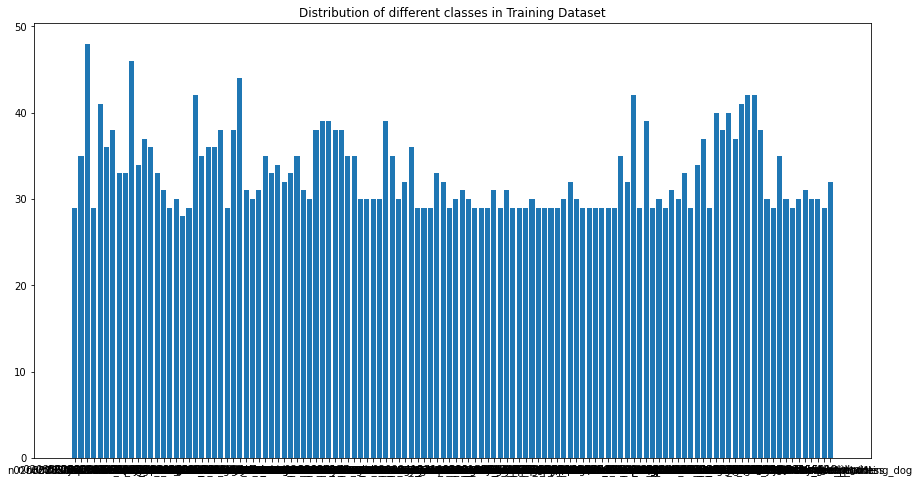

In [1017]:
image_folder = data_dir_list[:]
nimgs = {}
for i in image_folder:
    nimages = len(os.listdir(valid_dir+ '/'+i+'/'))
    nimgs[i]=nimages
plt.figure(figsize=(15, 8))
plt.bar(range(len(nimgs)), list(nimgs.values()), align='center')
plt.xticks(range(len(nimgs)), list(nimgs.keys()))
plt.title('Distribution of different classes in Training Dataset')
plt.show()

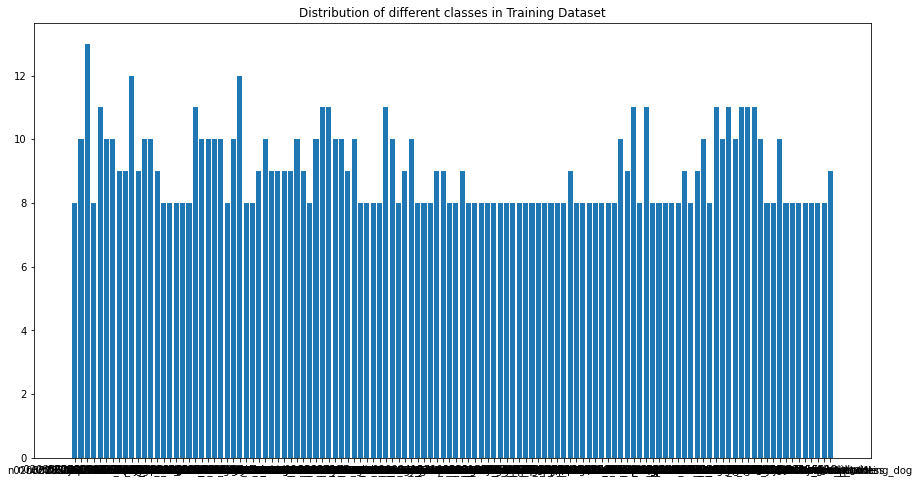

In [1018]:
image_folder = data_dir_list[:]
nimgs = {}
for i in image_folder:
    nimages = len(os.listdir(test_dir+ '/'+i+'/'))
    nimgs[i]=nimages
plt.figure(figsize=(15, 8))
plt.bar(range(len(nimgs)), list(nimgs.values()), align='center')
plt.xticks(range(len(nimgs)), list(nimgs.keys()))
plt.title('Distribution of different classes in Training Dataset')
plt.show()

In [185]:
#lst_train=[]
#lst_test=[]
#lst_valid= []
#for i in data_dir_list:
 #   lst_train.append(len(os.listdir(train_dir+'/'+i+'/')))
  #  lst_test.append(len(os.listdir(test_dir+'/'+i+'/')))
   # lst_valid.append(len(os.listdir(validation_dir+'/'+i+'/')))
    #print('Training {} images are: '.format(i)+str(len(os.listdir(train_dir+'/'+i+'/'))))
    #print(lst)
#index= np.array(data_dir_list).T
#data= np.array(lst_train).T
#df_data = pd.DataFrame(columns=['len_train', 'len_test', 'len_validation'], index=index)

#df_data['len_train'] = np.array(lst_train).T
#df_data['len_test'] = np.array(lst_test).T
#df_data['len_validation'] = np.array(lst_valid).T
#df_data

In [102]:
def get_filename_images(image_dir): 
    image_file = []
    image_index=0
    for type in os.listdir(image_dir):
        
        type_images = os.listdir(image_dir + type)
        
        for image in type_images:
            
            image_file.append(image)
            image_index += 1
      
    return  image_file

train_file_name= get_filename_images(train_dir+'/')
valid_file_name= get_filename_images(validation_dir+ '/')
test_file_name= get_filename_images(test_dir+ '/')

train_df= data[data["filename"].isin(train_file_name)]
valid_df= data[data["filename"].isin(valid_file_name)]
test_df= data[data["filename"].isin(test_file_name)]

test_df.head()

,filename,image_path,cropped_path,widths,heights,xmin,xmax,ymin,ymax,category
48,n02085620_2517.jpg,C:/Users/PC/python/OpenClassrooms/Projet6/Imag...,C:/Users/PC/python/OpenClassrooms/Projet6/imag...,500,375,125,372,26,314,Chihuahua
56,n02085620_2815.jpg,C:/Users/PC/python/OpenClassrooms/Projet6/Imag...,C:/Users/PC/python/OpenClassrooms/Projet6/imag...,500,600,60,495,6,597,Chihuahua
85,n02085620_3838.jpg,C:/Users/PC/python/OpenClassrooms/Projet6/Imag...,C:/Users/PC/python/OpenClassrooms/Projet6/imag...,468,344,75,349,2,324,Chihuahua
86,n02085620_3875.jpg,C:/Users/PC/python/OpenClassrooms/Projet6/Imag...,C:/Users/PC/python/OpenClassrooms/Projet6/imag...,500,333,125,340,14,332,Chihuahua
89,n02085620_3928.jpg,C:/Users/PC/python/OpenClassrooms/Projet6/Imag...,C:/Users/PC/python/OpenClassrooms/Projet6/imag...,500,375,75,399,21,374,Chihuahua


In [6]:
def save_obj(obj, name):
    with open(root_data + name + '.pkl', 'wb') as f:
        pickle.dump(obj, f, pickle.HIGHEST_PROTOCOL)

def load_obj(name):
    with open(root_data + name + '.pkl', 'rb') as f:
        return pickle.load(f)

In [103]:
# Save data object
save_obj(data, 'data')

# Save train_df object
save_obj(train_df, 'train_df')

#Save valid_df object
save_obj(valid_df, 'valid_df')

#Save test_df object
save_obj(test_df, 'test_df')

In [7]:
data= load_obj('Data')
test_df = load_obj('test_df')
train_df = load_obj('train_df')
valid_df = load_obj('valid_df')
data.head()

,filename,image_path,cropped_path,widths,heights,xmin,xmax,ymin,ymax,category
0,n02085620_10074.jpg,C:/Users/PC/python/OpenClassrooms/Projet6/Imag...,C:/Users/PC/python/OpenClassrooms/Projet6/imag...,333,500,25,276,10,498,Chihuahua
1,n02085620_10131.jpg,C:/Users/PC/python/OpenClassrooms/Projet6/Imag...,C:/Users/PC/python/OpenClassrooms/Projet6/imag...,395,495,49,393,9,493,Chihuahua
2,n02085620_10621.jpg,C:/Users/PC/python/OpenClassrooms/Projet6/Imag...,C:/Users/PC/python/OpenClassrooms/Projet6/imag...,500,298,142,335,43,250,Chihuahua
3,n02085620_1073.jpg,C:/Users/PC/python/OpenClassrooms/Projet6/Imag...,C:/Users/PC/python/OpenClassrooms/Projet6/imag...,345,500,0,312,27,498,Chihuahua
4,n02085620_10976.jpg,C:/Users/PC/python/OpenClassrooms/Projet6/Imag...,C:/Users/PC/python/OpenClassrooms/Projet6/imag...,322,484,90,242,104,452,Chihuahua



<div class="alert alert-info" style="background-color:#5d3a8e; color:white; padding:0px 10px; border-radius:5px;"><h2 style='margin:10px 5px'> About ImageDataGenerator </h2>
</div>



- ImageDataGenerator is a known Keras class which has 2 main functionalities:
 - - Data Augmentation : this is a technique which can reduce the overfetting by increasing the amount of observations in the training data. In the case of images this is done via 'affine Transformations' for example 
 
 - - Loading image data from disk : this allows the user to train over more than the one that is able to fit in memory
 
 # About flow_from_directory: 
 
- The most known use of ImageDataGenerator is via its flow_from_directory method, which allows you to do several tasks but it's restrcited to the following directory structure of your data:





# About flow_from_dataframe
- In order to provide Keras users with a more flexible API and keeping the two main advantages, the method flow_from_dataframe was introduced. Under the hood the mechanics are handle by the DataFrameIterator class which will cover a wide variety of cases that flow_from_directory is not able to do.


Augmentations
1. Flipping
Starting with perhaps the easiest to implement, you can (easily) flip images:

horizontally: makes an image of an arrow pointing left point in the opposite direction - to the right, and vice-versa
vertically: makes an arrow pointing down point up, and vice-versa.
It is more difficult, due the general rectangular shape of images, but you could flip an image diagonally, but I haven't seen anyone do that really. It is getting close to the idea of rotation, I suppose.

2. Rotation
In this case, we simply rotate the image about its center by a random number of degrees, usually within a range of [-5, +5] degrees. Even tiny small angles, which we can maybe hardly perceive, this is a simple trick that can add a lot of rubustness to a model.

3. Crop
We take "chunks" of an image, either at random or using a pre-defined pattern. This helps the model perhaps focus on certain areas of images and not be overwhelmed by perhaps unimportant features. It also simply creates more data.

You might also incorporate this augmentation method as a means to resize your input images to fit into a pre-trained model, which took input images of a different size to your data.

4. Normalisation
This is more of a numerical optimisation trick that one which can really be interpreted from a visual perspective. Many algorithms will be more stable whilst working with smaller numbers, as values are less likely to explode. Numbers closer together (in the sense of continuous space with a linear scale) are also more liekly to produce a smoother optimisation path.

One way of performing normalisation is:

first computing a mean and standard deviation of the images, then
(from all images) we subtract the mean and divide by the standard deviation.
This will produce images whose pixel values that lie over some range, but have a mean value of zero. Have a look here for some other methods and more discussion. You can normalise e.g. over whole images or just over the separate colour channels (RedGreenBlue).

One thing to keep in mind, is that the values used for optimisation must come from the training dataset itself, and must not be computed over the entire dataset including the validation/test datasets. This is because that information should not be passed to the model in any way - it is kind of cheating.

5. Translations
SImply move the image up, down, left or right by some amount, such as 10 pixels, or again within a range of [-5, +5] % of the image size. This will produce pixels along either one or two axes, which must be filled by another colour because the picture has moved out of the frame. It is common to use black or white for these "empty" parts, but you could also use the average pixel value or even crop the shifted image to remove them.

6. Rescaling
This is a less obvious augmentation step, but can add value because the model will be able to extract different features (more or less general) from larger and smaller images. A small image without much detail would only allow the model to learn higher level, or hazier features and not be able to focus on specific details that are available in high resolution images.

Methods such as progressive resizing, commonly used for training GAN architectures, start with smaller images and slowly work up to larger images. This can be done to keep training as stable as possible (in GANs it can increase robustness against mode collapse), but also coincides with the notion that early layers in a network learn high-level features, and layers deeper into e.g. a convolutional network learn representations that are more detailed. Why do the early layers require high resolution images? Let's give them low resolution images, train quicker and hopefully generalise slightly better!

7. Be creative!!
I once made a model for a self-driving car. I knew that the track where the model would be tested had many trees and quite a few high walls, which oth created shadows over the road. These shadows looked a lot like straight lines representing the edges of the road! So I added shadows to my images, at random intensities and random angles with random sizes. The car learnt that a change in brightness over a straight line did not necessarily mean the edge of the road and hence stopped freaking out when it reached one!

Think about the artefacts of your training data and the situations your model will face in the validation data, and try to incorporate them. This is really like feature engineering, incorporated into a model via augmentation... and it can help a lot!

In [222]:
# image is divided into small blocks called “tiles” (tileSize is 8×8 by default in OpenCV).
#Then each of these blocks are histogram equalized as usual. 
# So in a small area, histogram would confine to a small region

def Histogram_Equalization(img, adaptative=True):
    #cv2.equalizeHist only works on grayscale ( 1 channel ) images. 
    img = img.astype(np.uint8)
    #Convert it to grayscale:
    ycrcb = cv2.cvtColor(img, cv2.COLOR_BGR2YCR_CB)
    # -----Splitting the ycrcb image to different channels-
    channels = cv2.split(ycrcb)
    if adaptative:
        # -----Applying CLAHE to L-channel
        clahe = cv2.createCLAHE(clipLimit=2.0, tileGridSize=(5,5))
        channels[0] = clahe.apply(channels[0])
    else:    
        #Apply histogram equalization with the function cv::equalizeHist :
        channels[0]= cv2.equalizeHist(channels[0])  
    ycrcb= cv2.merge(channels)  
    img= cv2.cvtColor(ycrcb, cv2.COLOR_YCR_CB2BGR)
    return img 

In [461]:
#img= r'C:\Users\PC\python\OpenClassrooms\Projet6\data_Folder\train\n02086646-Blenheim_spaniel\n02086646_3.jpg'

#plt.imshow(Histogram_Equalization(img_to_array(load_img(img))))


<div class="alert alert-info" style="background-color:#5d3a8e; color:white; padding:0px 10px; border-radius:5px;"><h2 style='margin:10px 5px'> Work only one 10 classes:   </h2>
</div>


In [8]:
original_dataset_dir= root_images
base_dir= 'C:/Users/PC/python/OpenClassrooms/Projet6/image_crop_10_Folder'
os.mkdir(base_dir)

FileExistsError: [WinError 183] Impossible de créer un fichier déjà existant: 'C:/Users/PC/python/OpenClassrooms/Projet6/image_crop_10_Folder'

In [270]:
data_10_Folder= 'C:/Users/PC/python/OpenClassrooms/Projet6/data_10_Folder'
os.mkdir(data_Folder)

In [9]:
data_dir_list[:10]

['n02085620-Chihuahua',
 'n02085782-Japanese_spaniel',
 'n02085936-Maltese_dog',
 'n02086079-Pekinese',
 'n02086240-Shih-Tzu',
 'n02086646-Blenheim_spaniel',
 'n02086910-papillon',
 'n02087046-toy_terrier',
 'n02087394-Rhodesian_ridgeback',
 'n02088094-Afghan_hound']

In [10]:
Data_10= data[data["category"].isin(['Chihuahua','Japanese_spaniel','Maltese_dog', 'Pekinese', 'Shih-Tzu', 'Blenheim_spaniel' , 'papillon', 'toy_terrier', 'Rhodesian_ridgeback', 'Afghan_hound' ])]

train_df_10= train_df[train_df["category"].isin(['Chihuahua','Japanese_spaniel','Maltese_dog', 'Pekinese', 'Shih-Tzu', 'Blenheim_spaniel' , 'papillon', 'toy_terrier', 'Rhodesian_ridgeback', 'Afghan_hound' ])]
test_df_10= test_df[test_df["category"].isin(['Chihuahua','Japanese_spaniel','Maltese_dog', 'Pekinese', 'Shih-Tzu', 'Blenheim_spaniel' , 'papillon', 'toy_terrier', 'Rhodesian_ridgeback', 'Afghan_hound' ])]
valid_df_10= valid_df[valid_df["category"].isin(['Chihuahua','Japanese_spaniel','Maltese_dog', 'Pekinese', 'Shih-Tzu', 'Blenheim_spaniel' , 'papillon', 'toy_terrier', 'Rhodesian_ridgeback', 'Afghan_hound' ])]


In [11]:
test_df_10.head()

,filename,image_path,cropped_path,widths,heights,xmin,xmax,ymin,ymax,category
48,n02085620_2517.jpg,C:/Users/PC/python/OpenClassrooms/Projet6/Imag...,C:/Users/PC/python/OpenClassrooms/Projet6/imag...,500,375,125,372,26,314,Chihuahua
56,n02085620_2815.jpg,C:/Users/PC/python/OpenClassrooms/Projet6/Imag...,C:/Users/PC/python/OpenClassrooms/Projet6/imag...,500,600,60,495,6,597,Chihuahua
85,n02085620_3838.jpg,C:/Users/PC/python/OpenClassrooms/Projet6/Imag...,C:/Users/PC/python/OpenClassrooms/Projet6/imag...,468,344,75,349,2,324,Chihuahua
86,n02085620_3875.jpg,C:/Users/PC/python/OpenClassrooms/Projet6/Imag...,C:/Users/PC/python/OpenClassrooms/Projet6/imag...,500,333,125,340,14,332,Chihuahua
89,n02085620_3928.jpg,C:/Users/PC/python/OpenClassrooms/Projet6/Imag...,C:/Users/PC/python/OpenClassrooms/Projet6/imag...,500,375,75,399,21,374,Chihuahua


In [538]:
Data_10.to_csv('Data_10.csv') 
train_df_10.to_csv('train_df_10.csv')
test_df_10.to_csv('test_df_10.csv')
valid_df_10.to_csv('valid_df_10.csv')

#train_df_10= pd.read_csv(r'C:\Users\PC\python\OpenClassrooms\Projet6\data_10_Folder\train_df_10.csv')


In [14]:
#from tensorflow.python.keras.applications.resnet50 import ResNet50, preprocess_input

img_width=256; img_height=256
batch_size=16

In [12]:
#TRAINING_DIR
train_dir= r'C:\Users\PC\python\OpenClassrooms\Projet6\data_10_Folder\train/'
validation_dir= r'C:\Users\PC\python\OpenClassrooms\Projet6\data_10_Folder\validation/'
test_dir= r'C:\Users\PC\python\OpenClassrooms\Projet6\data_10_Folder\test/'


In [16]:
TRAINING_DIR = train_dir+'/'

train_datagen = ImageDataGenerator(
                                    rescale = 1/255.0,
                                    rotation_range=30,
                                    zoom_range=0.1,
                                    horizontal_flip=True,
                                    width_shift_range=0.1,
                                    height_shift_range=0.1,
                                    shear_range=0.01,
                                    brightness_range=[0.8, 1.5])


train_batches  = train_datagen.flow_from_directory(TRAINING_DIR,
                                                    batch_size=batch_size,
                                                    class_mode='categorical',
                                                    color_mode= 'rgb',
                                                    target_size=(img_height, img_width),
                                                    )

Found 1451 images belonging to 10 classes.


In [17]:
VALIDATION_DIR = validation_dir+'/'

validation_datagen = ImageDataGenerator(
                                        rescale = 1/255.0)

valid_batches  = validation_datagen.flow_from_directory(VALIDATION_DIR,
                                                        batch_size=batch_size,
                                                        color_mode= 'rgb',
                                                        class_mode='categorical',
                                                        target_size=(img_height, img_width),
                                                          )

Found 368 images belonging to 10 classes.


In [18]:
# show class indices
print('****************')
for cls, idx in train_batches.class_indices.items():
    print('Class #{} = {}'.format(idx, cls.split('-')[-1]))
print('****************')

****************
Class #0 = Chihuahua
Class #1 = Japanese_spaniel
Class #2 = Maltese_dog
Class #3 = Pekinese
Class #4 = Tzu
Class #5 = Blenheim_spaniel
Class #6 = papillon
Class #7 = toy_terrier
Class #8 = Rhodesian_ridgeback
Class #9 = Afghan_hound
****************


In [19]:
#for cls, idx in train_batches.class_indices.items():
num_classes = len(train_batches.class_indices) 
train_labels = train_batches.classes 
#print(train_labels)
train_labels = keras.utils.to_categorical(train_labels, num_classes=num_classes)

valid_labels = valid_batches.classes 
valid_labels = keras.utils.to_categorical(valid_labels, num_classes=num_classes)
nb_train_samples = len(train_batches.filenames)  
nb_valid_samples = len(valid_batches.filenames)
#print(num_classes)

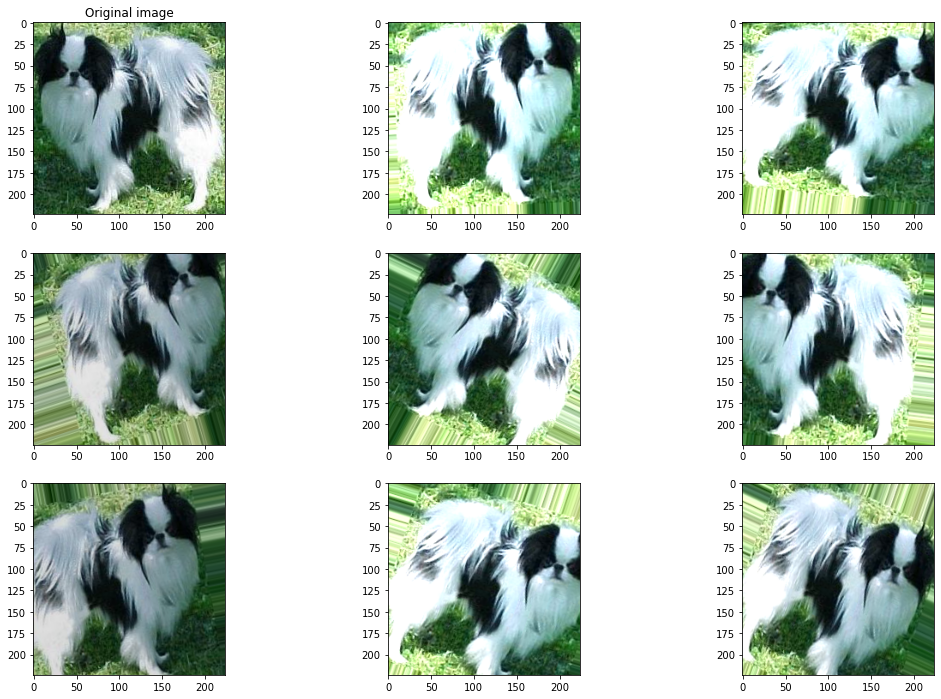

In [20]:
from numpy import expand_dims
img= load_img(r'C:\Users\PC\python\OpenClassrooms\Projet6\data_10_Folder\train\n02085782-Japanese_spaniel\n02085782_2.jpg')
plt.figure(figsize= (18, 12))
plt.subplot(3, 3, 1)
plt.imshow(img, aspect=True)
plt.title('Original image')

data= img_to_array(img)
samples= expand_dims(data, 0)
it= train_datagen.flow(samples, batch_size= 1)

for i in range(8):
    plt.subplot(3, 3, i+2)
    #plt.subplot(330+1+i)
    batch=it.next()
    image= batch[0]
    plt.imshow(image)
plt.savefig('augmented_image.png', transparent=False, bbox_inches='tight', dpi=900)
plt.show()
    


<div class="alert alert-info" style="background-color:#5d3a8e; color:white; padding:0px 10px; border-radius:5px;"><h2 style='margin:10px 5px'> Convolutional Neural Network:   </h2>
</div>


- The following chart shows roughly how the data flows in the Convolutional Neural Network that is implemented below. First the network has a pre-processing layer which distorts the input images so as to artificially inflate the training-set. Then the network has two convolutional layers, two fully-connected layers and finally a softmax classification layer. 

- In this case the image is mis-classified. The image actually shows a dog but the neural network is confused whether it is a dog or a cat and thinks the image is most likely a cat.

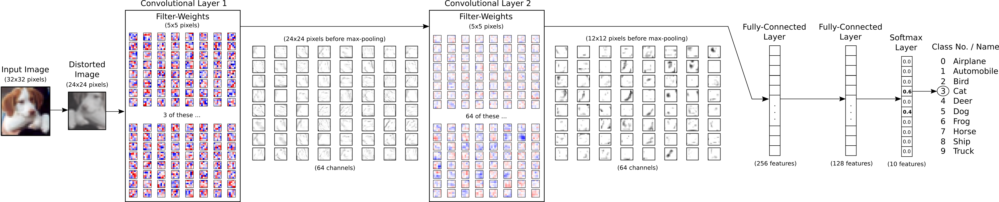

In [756]:
from IPython.display import Image
Image('06_network_flowchart.png')

In [531]:
model_filename='best_model_10.h5'
stopping = EarlyStopping(monitor='val_accuracy', patience=5)
checkpointer = ModelCheckpoint(model_filename, #path to save the model file
                               verbose=1, 
                               save_best_only=True ,
                               save_weights_only=False, 
                               monitor='val_accuracy' , 
                               mode='max')


<div class="alert alert-info" style="background-color:#5d3a8e; color:white; padding:0px 10px; border-radius:5px;"><h2 style='margin:10px 5px'> Sequential Model:   </h2>
</div>

- The Keras API has two modes of costructing Neural Networks.The simplest is the sequential Model which only allows for layers to be added in sequence.

# Convolutional Layer:
- The following chart shows the basic idea of processing an image in the first convolutional layer. The input image depicts the number 7 and four copies of the image are shown here, so we can see more clearly how the filter is being moved to different positions of the image. Fo reach position of the filter, the dot-product is being calculated between the filter and the image pixels under the filter, which results in a single pixel in the output image. So moving the filter across the entire input image results in a new image being generated.
- The red filter_weights means that the filter has a positive reaction to black pixels in the input image, while blue pixels means the filter has a negative reaction to black pixels. 
- In this case it appears  that the filter recognizes the horizontal line of the 7-digit, as can be seen from its stronger reaction to that line in the output image. 

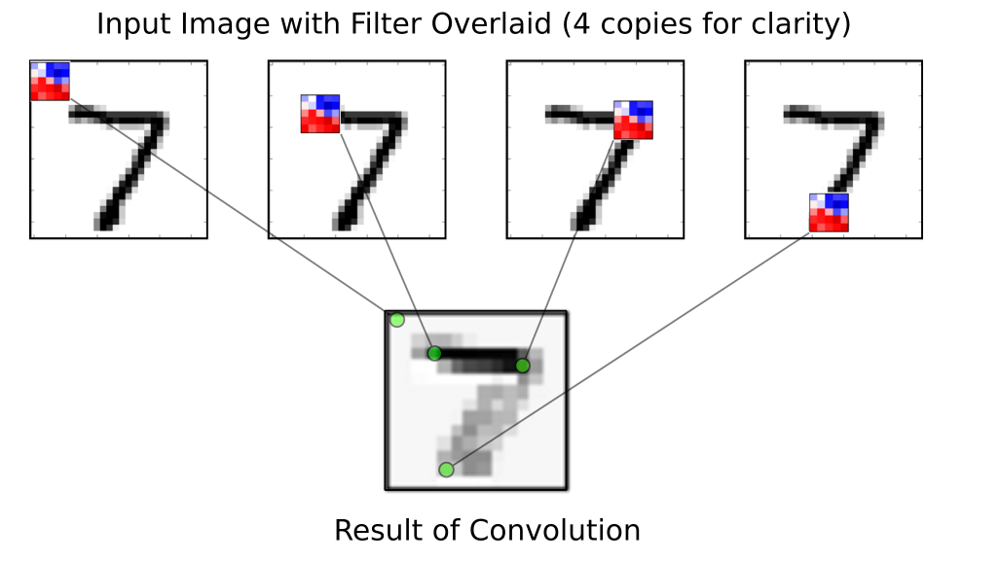

- The step-size for moving the filter across the inuput is called the STRIDE. There is a stride for moving the filter horizontally (x-axis) and another stride for moving vertically (y-axis) 

- When the filter reaches the end of the right-side as well as the bottom of the input image, then it can be padded with zeroes (white pixels). This causes the output image to be of the exact same dimension as the input image.

- Furthermore, the output of the convolution may be passed through a so-called Rectified Linear Unit (ReLU), which merely ensures that the output is positive because negative values are set to zero. The output may also be down-sampled by so-called max-pooling, which considers small windows of 2x2 pixels and only keeps the largest of those pixels. This halves the resolution of the input image e.g. from 28x28 to 14x14 pixels

- Note that the second convolutional layer is more complicated because it takes 16 input channels. We want a separate filter for each input channel, so we need 16 filters instead of just one. Furthermore, we want 36 output channels from the second convolutional layer, so in total we need 16 x 36 = 576 filters for the second convolutional layer. It can be a bit challenging to understand how this works.

In [532]:
# Neural Network Architecture 
model=Sequential()


model.add(Conv2D(16, kernel_size=(3,3), activation='relu', input_shape=(img_width,img_height,3) , padding='same', use_bias=True, kernel_initializer='glorot_uniform', bias_initializer='zeros', kernel_regularizer=None, bias_regularizer=None, activity_regularizer=None, kernel_constraint=None, bias_constraint=None))
model.add(BatchNormalization())
# model.add(LeakyReLU(alpha=0.1))
model.add(MaxPooling2D((2, 2), padding='same'))
# we add the dropout to skip the overfitting 
# model.add(Dropout(0.25))



model.add(Conv2D(32, kernel_size=(3,3), activation='relu', padding='same',  use_bias=True, kernel_initializer='glorot_uniform', bias_initializer='zeros', kernel_regularizer=None, bias_regularizer=None, activity_regularizer=None, kernel_constraint=None, bias_constraint=None))
# model.add(LeakyReLU(alpha=0.1))
model.add(BatchNormalization())
model.add(MaxPooling2D((2, 2), padding='same'))

# we add the dropout to skip the overfitting 
# model.add(Dropout(0.25))

model.add(Conv2D(64, kernel_size=(3,1), activation='relu', padding='same',  use_bias=True, kernel_initializer='glorot_uniform', bias_initializer='zeros', kernel_regularizer=None, bias_regularizer=None, activity_regularizer=None, kernel_constraint=None, bias_constraint=None))

#model.add(LeakyReLU(alpha=0.1))
model.add(BatchNormalization())
model.add(MaxPooling2D((2, 2), padding='same'))
#model.add(Dropout(0.25))

model.add(Conv2D(128, kernel_size=(3,1), activation='relu', padding='same',  use_bias=True, kernel_initializer='glorot_uniform', bias_initializer='zeros', kernel_regularizer=None, bias_regularizer=None, activity_regularizer=None, kernel_constraint=None, bias_constraint=None))
#model.add(LeakyReLU(alpha=0.1))
model.add(BatchNormalization())
model.add(MaxPooling2D((2, 2), padding='same'))

# we add the dropout to skip the overfitting 
model.add(Dropout(0.25))

model.add(Flatten())

model.add(Dense(1024, activation='relu',  use_bias=True, kernel_initializer='glorot_uniform', bias_initializer='zeros', kernel_regularizer=None, bias_regularizer=None, activity_regularizer=None, kernel_constraint=None, bias_constraint=None))
#model.add(LeakyReLU(alpha=0.1))
model.add(BatchNormalization())
model.add(Dropout(0.25))

#model.add(Dense(32 , activation='relu',  use_bias=True, kernel_initializer='glorot_uniform', bias_initializer='zeros', kernel_regularizer=None, bias_regularizer=None, activity_regularizer=None, kernel_constraint=None, bias_constraint=None))
model.add(Dense(256 , activation='relu',  use_bias=True, kernel_initializer='glorot_uniform', bias_initializer='zeros', kernel_regularizer=None, bias_regularizer=None, activity_regularizer=None, kernel_constraint=None, bias_constraint=None))
#model.add(LeakyReLU(alpha=0.1))
model.add(BatchNormalization())
model.add(Dropout(0.25))

model.add(Dense(num_classes, activation='softmax',  use_bias=True, kernel_initializer='glorot_uniform', bias_initializer='zeros', kernel_regularizer=None, bias_regularizer=None, activity_regularizer=None, kernel_constraint=None, bias_constraint=None))

model.compile(loss='categorical_crossentropy', optimizer=RMSprop(), metrics=['accuracy'])


model.summary()


Model: "sequential_10"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d_121 (Conv2D)          (None, 256, 256, 16)      448       
_________________________________________________________________
batch_normalization_131 (Bat (None, 256, 256, 16)      64        
_________________________________________________________________
max_pooling2d_37 (MaxPooling (None, 128, 128, 16)      0         
_________________________________________________________________
conv2d_122 (Conv2D)          (None, 128, 128, 32)      4640      
_________________________________________________________________
batch_normalization_132 (Bat (None, 128, 128, 32)      128       
_________________________________________________________________
max_pooling2d_38 (MaxPooling (None, 64, 64, 32)        0         
_________________________________________________________________
conv2d_123 (Conv2D)          (None, 64, 64, 64)      

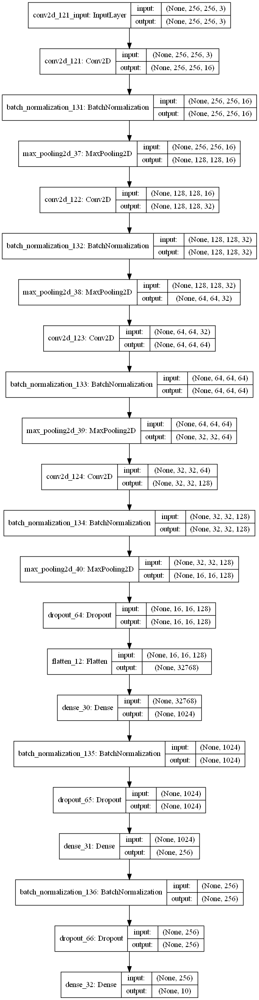

In [533]:
SVG(model_to_dot(model).create(prog='dot', format='svg'))
plot_model(model, to_file='model_plot.png', show_shapes=True, show_layer_names=True, expand_nested=True)


<div class="alert alert-info" style="background-color:#5d3a8e; color:white; padding:0px 10px; border-radius:5px;"><h2 style='margin:10px 5px'> Model Compilation:   </h2>
</div>

- The Neural Network has now been defined and must be finalized by adding a loss-function, optimizer and performance metrics. This is called model "compilation" in Keras.

- We can either define the optimizer using a string, or if we want more control of its parameters then we need to instantiate an object. For example, we can set the learning-rate

- For a classification-problem such as Dog Classification which has 120 possible classes, we need to use the loss-function called categorical_crossentropy. The performance metric we are interested in is the classification accuracy


<div class="alert alert-info" style="background-color:#5d3a8e; color:white; padding:0px 10px; border-radius:5px;"><h2 style='margin:10px 5px'> Training :   </h2>
</div>
- Now that the model has been fully defined with loss-function and optimizer, we can train it. This function takes numpy-arrays and performs the given number of training epochs using the given batch-size. An epoch is one full use of the entire training-set. So for 20 epochs we would iterate randomly over the entire training-set 20 times.

In [534]:
# train the model
results = model.fit_generator(train_batches,
                        steps_per_epoch = train_batches.samples // batch_size,
                        validation_data = valid_batches,
                        validation_steps = valid_batches.samples // batch_size,
                        callbacks=[stopping, checkpointer],   
                        verbose = 1, 
                        epochs = 20)

Epoch 1/20
 - 256s - loss: 2.6642 - accuracy: 0.2404 - val_loss: 5.3668 - val_accuracy: 0.1304

Epoch 00001: val_accuracy improved from -inf to 0.13043, saving model to best_model_10.h5
Epoch 2/20
 - 249s - loss: 2.1740 - accuracy: 0.3206 - val_loss: 4.5588 - val_accuracy: 0.1522

Epoch 00002: val_accuracy improved from 0.13043 to 0.15217, saving model to best_model_10.h5
Epoch 3/20
 - 250s - loss: 2.0664 - accuracy: 0.3345 - val_loss: 2.9834 - val_accuracy: 0.1821

Epoch 00003: val_accuracy improved from 0.15217 to 0.18207, saving model to best_model_10.h5
Epoch 4/20
 - 248s - loss: 1.9265 - accuracy: 0.3631 - val_loss: 2.4779 - val_accuracy: 0.2283

Epoch 00004: val_accuracy improved from 0.18207 to 0.22826, saving model to best_model_10.h5
Epoch 5/20
 - 249s - loss: 1.8078 - accuracy: 0.3965 - val_loss: 2.4396 - val_accuracy: 0.2880

Epoch 00005: val_accuracy improved from 0.22826 to 0.28804, saving model to best_model_10.h5
Epoch 6/20
 - 253s - loss: 1.7475 - accuracy: 0.4181 - val

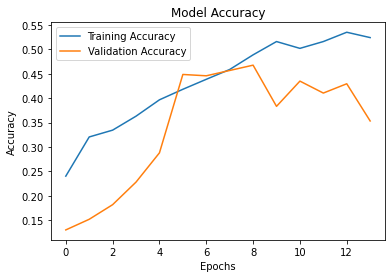

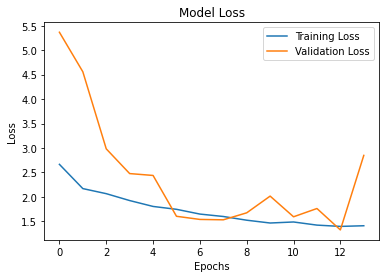

In [535]:
plt.subplot()
plt.title('Model Accuracy')
plt.plot(results.history['accuracy'])
plt.plot(results.history['val_accuracy'])
plt.ylabel('Accuracy')
plt.xlabel('Epochs')
plt.legend(['Training Accuracy','Validation Accuracy'])
plt.savefig('baseline_acc_epoch.png', transparent= False, bbox_inches= 'tight', dpi= 900)
plt.show()

plt.title('Model Loss')
plt.plot(results.history['loss'])
plt.plot(results.history['val_loss'])
plt.ylabel('Loss')
plt.xlabel('Epochs')
plt.legend(['Training Loss','Validation Loss'])
plt.savefig('baseline_loss_epoch.png', transparent= False, bbox_inches= 'tight', dpi= 900)
plt.show()

<div class="alert alert-info" style="background-color:#5d3a8e; color:white; padding:0px 10px; border-radius:5px;"><h2 style='margin:10px 5px'>  Evaluation:  </h2>
</div>

- Now that the model has been trained we can test its performance on the test_set. This also uses nympy_array as input 

In [644]:
from tensorflow.python.keras.models import load_model
# load the trained model
model = load_model('best_model_10.h5')

In [333]:
## Test Performance on Test Data
import pandas as pd
import numpy as np
from keras.preprocessing.image import load_img, img_to_array

In [645]:
test_df_10= pd.read_csv(r'C:\Users\PC\python\OpenClassrooms\Projet6\Data_10\test_df_10.csv')

In [646]:
# Read Test Images Dir and their labels
#test_images_dir = test_dir+'/'
test_df_10.head()
#test_df = load_obj('test_df')
#test_df.tail()

,Unnamed: 0,filename,image_path,cropped_path,widths,heights,xmin,xmax,ymin,ymax,category
0,48,n02085620_2517.jpg,C:/Users/PC/python/OpenClassrooms/Projet6/Imag...,C:/Users/PC/python/OpenClassrooms/Projet6/imag...,500,375,125,372,26,314,Chihuahua
1,56,n02085620_2815.jpg,C:/Users/PC/python/OpenClassrooms/Projet6/Imag...,C:/Users/PC/python/OpenClassrooms/Projet6/imag...,500,600,60,495,6,597,Chihuahua
2,85,n02085620_3838.jpg,C:/Users/PC/python/OpenClassrooms/Projet6/Imag...,C:/Users/PC/python/OpenClassrooms/Projet6/imag...,468,344,75,349,2,324,Chihuahua
3,86,n02085620_3875.jpg,C:/Users/PC/python/OpenClassrooms/Projet6/Imag...,C:/Users/PC/python/OpenClassrooms/Projet6/imag...,500,333,125,340,14,332,Chihuahua
4,89,n02085620_3928.jpg,C:/Users/PC/python/OpenClassrooms/Projet6/Imag...,C:/Users/PC/python/OpenClassrooms/Projet6/imag...,500,375,75,399,21,374,Chihuahua


In [727]:
TEST_DIR = test_dir+'/'

test_datagen = ImageDataGenerator(rescale = 1/255.0)


test_batches  = test_datagen.flow_from_directory(TEST_DIR,
                                               batch_size=1,
                                               class_mode='categorical',
                                               shuffle=False, 
                                              target_size=(img_height, img_width))
            
            


Found 100 images belonging to 10 classes.


In [732]:
Vloss_and_Vmetrics = model.evaluate(test_batches,  steps = test_batches.samples // 1)

  ...
    to  
  ['...']
  7/368 [..............................] - ETA: 5:31 - loss: 1.3834 - accuracy: 0.4700WARNING:tensorflow:Your input ran out of data; interrupting training. Make sure that your dataset or generator can generate at least `steps_per_epoch * epochs` batches (in this case, 368 batches). You may need to use the repeat() function when building your dataset.


In [733]:
Vloss_and_Vmetrics

[0.026314218791768602, 0.47]

<div class="alert alert-info" style="background-color:#5d3a8e; color:white; padding:0px 10px; border-radius:5px;"><h2 style='margin:10px 5px'>  Prediction:   </h2>
</div>

- We can also predict the classification for new images. We will just use some images from the test-set but you could load your own images into numpy arrays and use those instead.

In [734]:
loss_and_metrics = model.predict_generator(test_batches,  verbose= 1)
#loss_and_metrics = model.evaluate(test_batches, steps= test_batches.samples // batch_size, verbose= 1)
#loss_and_metrics= model.evaluate( valid_batches ,steps = valid_batches.samples // batch_size )

7/7 [==============================] - 9s 1s/step


In [735]:
predicted_class_indices= np.argmax(loss_and_metrics, axis=1)
predicted_class_indices

array([6, 4, 5, 4, 6, 5, 0, 8, 6, 6, 6, 5, 6, 6, 2, 4, 6, 6, 2, 9, 2, 9,
       1, 2, 2, 2, 1, 2, 2, 2, 2, 8, 6, 4, 4, 8, 9, 9, 9, 4, 4, 2, 4, 4,
       6, 9, 4, 4, 0, 6, 4, 5, 5, 6, 5, 5, 8, 8, 5, 6, 1, 7, 6, 2, 6, 8,
       8, 6, 6, 6, 4, 6, 8, 4, 8, 4, 9, 7, 1, 8, 8, 8, 9, 8, 8, 8, 8, 8,
       9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9], dtype=int64)

In [736]:
test_df_10['predicted'] = predicted_class_indices
test_df_10

,Unnamed: 0,filename,image_path,cropped_path,widths,heights,xmin,xmax,ymin,ymax,category,predicted
0,48,n02085620_2517.jpg,C:/Users/PC/python/OpenClassrooms/Projet6/Imag...,C:/Users/PC/python/OpenClassrooms/Projet6/imag...,500,375,125,372,26,314,Chihuahua,6
1,56,n02085620_2815.jpg,C:/Users/PC/python/OpenClassrooms/Projet6/Imag...,C:/Users/PC/python/OpenClassrooms/Projet6/imag...,500,600,60,495,6,597,Chihuahua,4
2,85,n02085620_3838.jpg,C:/Users/PC/python/OpenClassrooms/Projet6/Imag...,C:/Users/PC/python/OpenClassrooms/Projet6/imag...,468,344,75,349,2,324,Chihuahua,5
3,86,n02085620_3875.jpg,C:/Users/PC/python/OpenClassrooms/Projet6/Imag...,C:/Users/PC/python/OpenClassrooms/Projet6/imag...,500,333,125,340,14,332,Chihuahua,4
4,89,n02085620_3928.jpg,C:/Users/PC/python/OpenClassrooms/Projet6/Imag...,C:/Users/PC/python/OpenClassrooms/Projet6/imag...,500,375,75,399,21,374,Chihuahua,6
...,...,...,...,...,...,...,...,...,...,...,...,...
95,1868,n02088094_5504.jpg,C:/Users/PC/python/OpenClassrooms/Projet6/Imag...,C:/Users/PC/python/OpenClassrooms/Projet6/imag...,480,360,111,392,76,322,Afghan_hound,9
96,1895,n02088094_7894.jpg,C:/Users/PC/python/OpenClassrooms/Projet6/Imag...,C:/Users/PC/python/OpenClassrooms/Projet6/imag...,500,376,91,415,45,337,Afghan_hound,9
97,1896,n02088094_791.jpg,C:/Users/PC/python/OpenClassrooms/Projet6/Imag...,C:/Users/PC/python/OpenClassrooms/Projet6/imag...,396,500,17,353,11,483,Afghan_hound,9
98,1905,n02088094_8764.jpg,C:/Users/PC/python/OpenClassrooms/Projet6/Imag...,C:/Users/PC/python/OpenClassrooms/Projet6/imag...,333,500,107,291,190,396,Afghan_hound,9


In [737]:
labels= (train_batches.class_indices)
labels

{'n02085620-Chihuahua': 0,
 'n02085782-Japanese_spaniel': 1,
 'n02085936-Maltese_dog': 2,
 'n02086079-Pekinese': 3,
 'n02086240-Shih-Tzu': 4,
 'n02086646-Blenheim_spaniel': 5,
 'n02086910-papillon': 6,
 'n02087046-toy_terrier': 7,
 'n02087394-Rhodesian_ridgeback': 8,
 'n02088094-Afghan_hound': 9}

In [738]:
# show class indices
print('****************')
for cls, idx in labels.items():
    print('Class #{} = {}'.format(idx, cls.split('-')[-1]))
print('****************')

****************
Class #0 = Chihuahua
Class #1 = Japanese_spaniel
Class #2 = Maltese_dog
Class #3 = Pekinese
Class #4 = Tzu
Class #5 = Blenheim_spaniel
Class #6 = papillon
Class #7 = toy_terrier
Class #8 = Rhodesian_ridgeback
Class #9 = Afghan_hound
****************


In [739]:
labels= dict((idx, cls.split('-')[-1]) for cls, idx in labels.items())
labels.update({4: 'Shih-Tzu'})
#labels= dict((v, k) for k, v in labels.items())
labels


{0: 'Chihuahua',
 1: 'Japanese_spaniel',
 2: 'Maltese_dog',
 3: 'Pekinese',
 4: 'Shih-Tzu',
 5: 'Blenheim_spaniel',
 6: 'papillon',
 7: 'toy_terrier',
 8: 'Rhodesian_ridgeback',
 9: 'Afghan_hound'}

In [740]:
classes= labels.values()

In [741]:
predictions= [labels[k] for k in predicted_class_indices]
print(predictions)

['papillon', 'Shih-Tzu', 'Blenheim_spaniel', 'Shih-Tzu', 'papillon', 'Blenheim_spaniel', 'Chihuahua', 'Rhodesian_ridgeback', 'papillon', 'papillon', 'papillon', 'Blenheim_spaniel', 'papillon', 'papillon', 'Maltese_dog', 'Shih-Tzu', 'papillon', 'papillon', 'Maltese_dog', 'Afghan_hound', 'Maltese_dog', 'Afghan_hound', 'Japanese_spaniel', 'Maltese_dog', 'Maltese_dog', 'Maltese_dog', 'Japanese_spaniel', 'Maltese_dog', 'Maltese_dog', 'Maltese_dog', 'Maltese_dog', 'Rhodesian_ridgeback', 'papillon', 'Shih-Tzu', 'Shih-Tzu', 'Rhodesian_ridgeback', 'Afghan_hound', 'Afghan_hound', 'Afghan_hound', 'Shih-Tzu', 'Shih-Tzu', 'Maltese_dog', 'Shih-Tzu', 'Shih-Tzu', 'papillon', 'Afghan_hound', 'Shih-Tzu', 'Shih-Tzu', 'Chihuahua', 'papillon', 'Shih-Tzu', 'Blenheim_spaniel', 'Blenheim_spaniel', 'papillon', 'Blenheim_spaniel', 'Blenheim_spaniel', 'Rhodesian_ridgeback', 'Rhodesian_ridgeback', 'Blenheim_spaniel', 'papillon', 'Japanese_spaniel', 'toy_terrier', 'papillon', 'Maltese_dog', 'papillon', 'Rhodesian_

In [742]:
test_df_10['predicted'] = predictions  # position of max probability
test_df_10

,Unnamed: 0,filename,image_path,cropped_path,widths,heights,xmin,xmax,ymin,ymax,category,predicted
0,48,n02085620_2517.jpg,C:/Users/PC/python/OpenClassrooms/Projet6/Imag...,C:/Users/PC/python/OpenClassrooms/Projet6/imag...,500,375,125,372,26,314,Chihuahua,papillon
1,56,n02085620_2815.jpg,C:/Users/PC/python/OpenClassrooms/Projet6/Imag...,C:/Users/PC/python/OpenClassrooms/Projet6/imag...,500,600,60,495,6,597,Chihuahua,Shih-Tzu
2,85,n02085620_3838.jpg,C:/Users/PC/python/OpenClassrooms/Projet6/Imag...,C:/Users/PC/python/OpenClassrooms/Projet6/imag...,468,344,75,349,2,324,Chihuahua,Blenheim_spaniel
3,86,n02085620_3875.jpg,C:/Users/PC/python/OpenClassrooms/Projet6/Imag...,C:/Users/PC/python/OpenClassrooms/Projet6/imag...,500,333,125,340,14,332,Chihuahua,Shih-Tzu
4,89,n02085620_3928.jpg,C:/Users/PC/python/OpenClassrooms/Projet6/Imag...,C:/Users/PC/python/OpenClassrooms/Projet6/imag...,500,375,75,399,21,374,Chihuahua,papillon
...,...,...,...,...,...,...,...,...,...,...,...,...
95,1868,n02088094_5504.jpg,C:/Users/PC/python/OpenClassrooms/Projet6/Imag...,C:/Users/PC/python/OpenClassrooms/Projet6/imag...,480,360,111,392,76,322,Afghan_hound,Afghan_hound
96,1895,n02088094_7894.jpg,C:/Users/PC/python/OpenClassrooms/Projet6/Imag...,C:/Users/PC/python/OpenClassrooms/Projet6/imag...,500,376,91,415,45,337,Afghan_hound,Afghan_hound
97,1896,n02088094_791.jpg,C:/Users/PC/python/OpenClassrooms/Projet6/Imag...,C:/Users/PC/python/OpenClassrooms/Projet6/imag...,396,500,17,353,11,483,Afghan_hound,Afghan_hound
98,1905,n02088094_8764.jpg,C:/Users/PC/python/OpenClassrooms/Projet6/Imag...,C:/Users/PC/python/OpenClassrooms/Projet6/imag...,333,500,107,291,190,396,Afghan_hound,Afghan_hound



<div class="alert alert-info" style="background-color:#5d3a8e; color:white; padding:0px 10px; border-radius:5px;"><h2 style='margin:10px 5px'>  Mis-Classified Images:    </h2>
</div>

In [744]:
error_df = test_df_10[test_df_10['category'] != test_df_10['predicted']]
error_df.shape[0]

53

<AxesSubplot:>

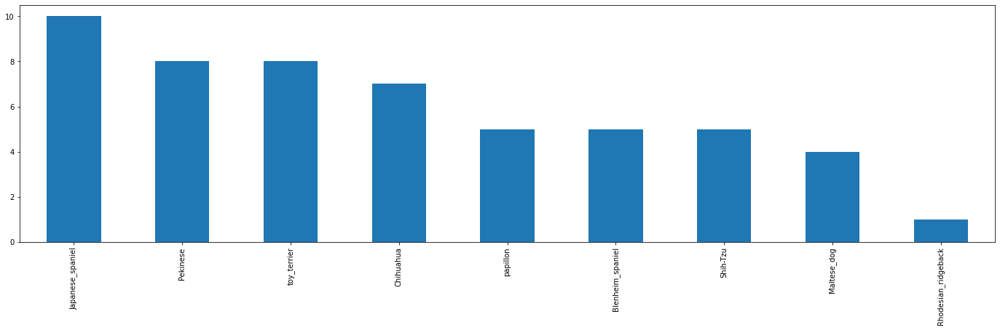

In [745]:
plt.figure(figsize=(24, 6))
error_df['category'].value_counts().plot.bar()

# Plot example Errors: 

In [ ]:
def plot_images(images, cls_true, cls_pred=None):
    assert len(images) == len(cls_true) == 9
    
    # Create figure with 3x3 sub-plots.
    fig, axes = plt.subplots(3, 3)
    fig.subplots_adjust(hspace=0.3, wspace=0.3)

    for i, ax in enumerate(axes.flat):
        # Plot image.
        ax.imshow(images[i].reshape(img_shape), cmap='binary')

        # Show true and predicted classes.
        if cls_pred is None:
            xlabel = "True: {0}".format(cls_true[i])
        else:
            xlabel = "True: {0}, Pred: {1}".format(cls_true[i], cls_pred[i])

        # Show the classes as the label on the x-axis.
        ax.set_xlabel(xlabel)
        
        # Remove ticks from the plot.
        ax.set_xticks([])
        ax.set_yticks([])
    
    # Ensure the plot is shown correctly with multiple plots
    # in a single Notebook cell.
    plt.show()

def plot_example_errors(error_df):
    images=[]
    cls_true=[]
    for i in range(10):
        
        img= load_img(error_df['image_path'][i])
        data= img_to_array(img)
        images.append(data)
        # Get the true classes for those images.
        cls_true.append(data.error_df['category'][i]

    # Plot the images and labels using our helper-function above.
    plot_images(images=images, cls_true=cls_true)


In [686]:
from sklearn.metrics import confusion_matrix
conf_mat = confusion_matrix(test_df_10['category'], test_df_10['predicted'])
#conf_mat

In [34]:
import itertools
def plot_confusion_matrix(cm, classes,
                          normalize=False,
                          title='Confusion matrix',
                          cmap=plt.cm.Blues):
    """
    This function prints and plots the confusion matrix.
    Normalization can be applied by setting `normalize=True`.
    """
    if normalize:
        cm = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis]
        print("Normalized confusion matrix")
    else:
        print('Confusion matrix, without normalization')

    # print(cm)

    plt.imshow(cm, interpolation='lanczos', cmap=cmap)
    plt.title(title)
    plt.colorbar()
    tick_marks = np.arange(len(classes))
    plt.xticks(tick_marks, classes, rotation=90)
    plt.yticks(tick_marks, classes)

    fmt = '.1f' if normalize else 'd'
    thresh = cm.max() / 2.
    for i in range (cm.shape[0]):
        for j in range (cm.shape[1]):
            plt.text(j, i, format(cm[i, j], fmt),
                 horizontalalignment="center",
                 color="white" if cm[i, j] > thresh else "black")

    plt.tight_layout()
    plt.ylabel('True label')
    plt.xlabel('Predicted label')

Confusion matrix, without normalization


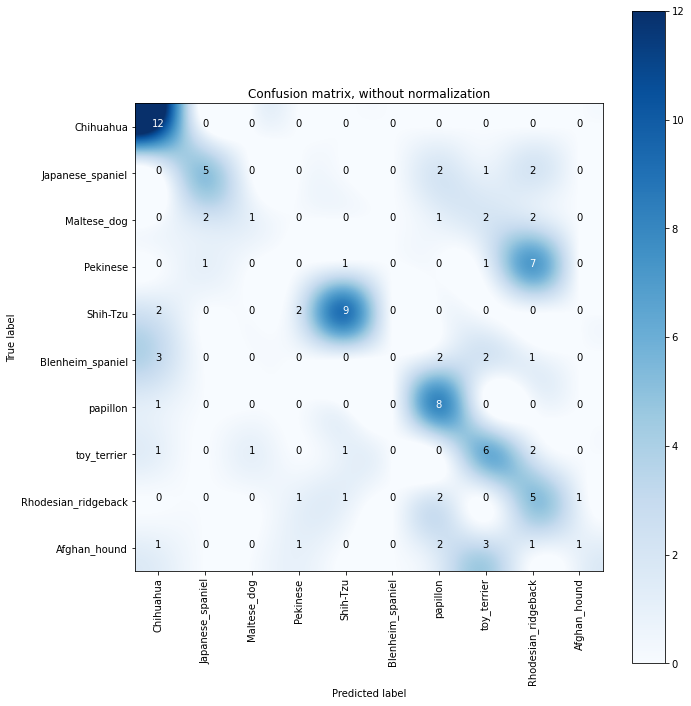

In [700]:
# Plot normalized confusion matrix
fig = plt.figure()
#fig.set_size_inches(35, 35, forward=True)
fig.set_size_inches(10, 10, forward=True)
fig.align_labels()

fig.subplots_adjust(left=0.0, right=1.0, bottom=0.0, top=1.0)
plot_confusion_matrix(conf_mat, classes=classes, title='Confusion matrix, without normalization')
plt.show()



<div class="alert alert-info" style="background-color:#5d3a8e; color:white; padding:0px 10px; border-radius:5px;"><h2 style='margin:10px 5px'>  Second Model:  </h2>
</div>

- We have 5 convolutional layres with kernel_size of (2, 2) and (2, 1) followed by BatchNormalization , MaxPooling of (2, 2) and 3 FCs with optimizer Adam and metrics accuracy 

In [771]:
model_filename='best_model_V2_10.h5'
stopping = EarlyStopping(monitor='val_accuracy', patience=5)
checkpointer = ModelCheckpoint(model_filename, #path to save the model file
                               verbose=1, 
                               save_best_only=True ,
                               save_weights_only=False, 
                               monitor='val_accuracy' , 
                               mode='max')

In [772]:
# Neural Network Architecture 
model_V2=Sequential()


model_V2.add(Conv2D(16, kernel_size=(2,2), activation='relu', input_shape=(img_width,img_height,3) , padding='same', use_bias=True, kernel_initializer='glorot_uniform', bias_initializer='zeros', kernel_regularizer=None, bias_regularizer=None, activity_regularizer=None, kernel_constraint=None, bias_constraint=None))
model_V2.add(BatchNormalization())
model_V2.add(MaxPooling2D((2, 2), padding='same'))




model_V2.add(Conv2D(32, kernel_size=(2,2), activation='relu', padding='same',  use_bias=True, kernel_initializer='glorot_uniform', bias_initializer='zeros', kernel_regularizer=None, bias_regularizer=None, activity_regularizer=None, kernel_constraint=None, bias_constraint=None))
# model.add(LeakyReLU(alpha=0.1))
model_V2.add(BatchNormalization())
model_V2.add(MaxPooling2D((2, 2), padding='same'))



model_V2.add(Conv2D(64, kernel_size=(2,1), activation='relu', padding='same',  use_bias=True, kernel_initializer='glorot_uniform', bias_initializer='zeros', kernel_regularizer=None, bias_regularizer=None, activity_regularizer=None, kernel_constraint=None, bias_constraint=None))
#model.add(LeakyReLU(alpha=0.1))
model_V2.add(BatchNormalization())
model_V2.add(MaxPooling2D((2, 2), padding='same'))

model_V2.add(Conv2D(128, kernel_size=(2,1), activation='relu', padding='same',  use_bias=True, kernel_initializer='glorot_uniform', bias_initializer='zeros', kernel_regularizer=None, bias_regularizer=None, activity_regularizer=None, kernel_constraint=None, bias_constraint=None))
#model.add(LeakyReLU(alpha=0.1))
model_V2.add(BatchNormalization())
model_V2.add(MaxPooling2D((2, 2), padding='same'))


model_V2.add(Conv2D(256, kernel_size=(2,1), activation='relu', padding='same',  use_bias=True, kernel_initializer='glorot_uniform', bias_initializer='zeros', kernel_regularizer=None, bias_regularizer=None, activity_regularizer=None, kernel_constraint=None, bias_constraint=None))
#model.add(LeakyReLU(alpha=0.1))
model_V2.add(BatchNormalization())
model_V2.add(MaxPooling2D((2, 2), padding='same'))



model_V2.add(Flatten())

model_V2.add(Dense(1024, activation='relu',  use_bias=True, kernel_initializer='glorot_uniform', bias_initializer='zeros', kernel_regularizer=None, bias_regularizer=None, activity_regularizer=None, kernel_constraint=None, bias_constraint=None))
#model.add(LeakyReLU(alpha=0.1))
model_V2.add(BatchNormalization())

model_V2.add(Dense(256 , activation='relu',  use_bias=True, kernel_initializer='glorot_uniform', bias_initializer='zeros', kernel_regularizer=None, bias_regularizer=None, activity_regularizer=None, kernel_constraint=None, bias_constraint=None))
#model.add(LeakyReLU(alpha=0.1))
model_V2.add(BatchNormalization())

model_V2.add(Dense(num_classes, activation='softmax',  use_bias=True, kernel_initializer='glorot_uniform', bias_initializer='zeros', kernel_regularizer=None, bias_regularizer=None, activity_regularizer=None, kernel_constraint=None, bias_constraint=None))
model_V2.compile(loss='categorical_crossentropy', optimizer=Adam(lr=0.001), metrics=['accuracy'])


model_V2.summary()

Model: "sequential_13"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d_156 (Conv2D)          (None, 256, 256, 16)      208       
_________________________________________________________________
batch_normalization_170 (Bat (None, 256, 256, 16)      64        
_________________________________________________________________
max_pooling2d_51 (MaxPooling (None, 128, 128, 16)      0         
_________________________________________________________________
conv2d_157 (Conv2D)          (None, 128, 128, 32)      2080      
_________________________________________________________________
batch_normalization_171 (Bat (None, 128, 128, 32)      128       
_________________________________________________________________
max_pooling2d_52 (MaxPooling (None, 64, 64, 32)        0         
_________________________________________________________________
conv2d_158 (Conv2D)          (None, 64, 64, 64)      

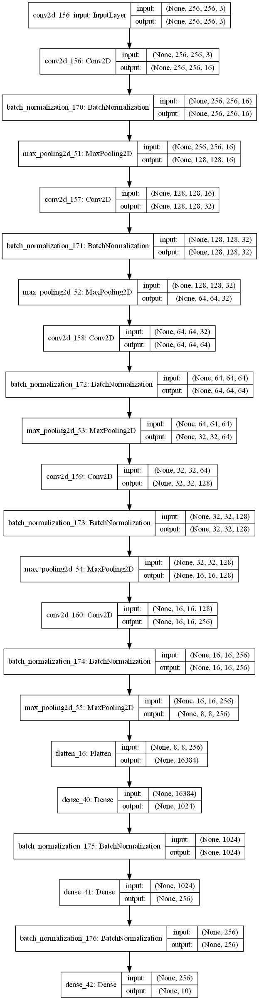

In [773]:
SVG(model_to_dot(model_V2).create(prog='dot', format='svg'))
plot_model(model_V2, to_file='model_plot.png', show_shapes=True, show_layer_names=True, expand_nested=True)

In [774]:
# train the model
results_V2 = model_V2.fit_generator(train_batches,
                        steps_per_epoch = train_batches.samples // batch_size,
                        validation_data = valid_batches,
                        validation_steps = valid_batches.samples // batch_size,
                        callbacks=[stopping, checkpointer],   
                        verbose = 1, 
                        epochs = 20)

Epoch 1/20
45/45 [==============================] - 112s 2s/step - loss: 2.6610 - accuracy: 0.2431 - val_loss: 10.0111 - val_accuracy: 0.1477

Epoch 00001: val_accuracy improved from -inf to 0.14773, saving model to best_model_V2_10.h5
Epoch 2/20
45/45 [==============================] - 105s 2s/step - loss: 2.0862 - accuracy: 0.3175 - val_loss: 18.0122 - val_accuracy: 0.1193

Epoch 00002: val_accuracy did not improve from 0.14773
Epoch 3/20
45/45 [==============================] - 106s 2s/step - loss: 2.0042 - accuracy: 0.3189 - val_loss: 13.2351 - val_accuracy: 0.1364

Epoch 00003: val_accuracy did not improve from 0.14773
Epoch 4/20
45/45 [==============================] - 106s 2s/step - loss: 1.8130 - accuracy: 0.3806 - val_loss: 13.0568 - val_accuracy: 0.1193

Epoch 00004: val_accuracy did not improve from 0.14773
Epoch 5/20
45/45 [==============================] - 107s 2s/step - loss: 1.7625 - accuracy: 0.4292 - val_loss: 11.2326 - val_accuracy: 0.1534

Epoch 00005: val_accuracy i

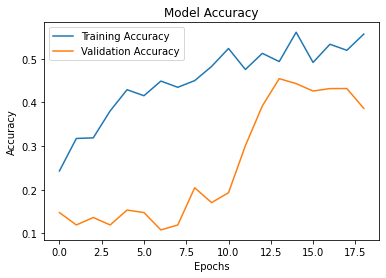

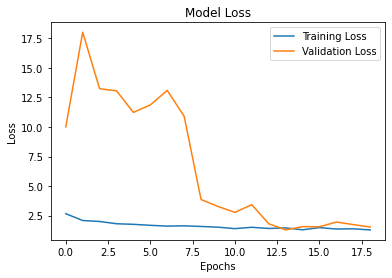

In [775]:
plt.subplot()
plt.title('Model Accuracy')
plt.plot(results_V2.history['accuracy'])
plt.plot(results_V2.history['val_accuracy'])
plt.ylabel('Accuracy')
plt.xlabel('Epochs')
plt.legend(['Training Accuracy','Validation Accuracy'])
plt.savefig('baseline_acc_epoch.png', transparent= False, bbox_inches= 'tight', dpi= 900)
plt.show()

plt.title('Model Loss')
plt.plot(results_V2.history['loss'])
plt.plot(results_V2.history['val_loss'])
plt.ylabel('Loss')
plt.xlabel('Epochs')
plt.legend(['Training Loss','Validation Loss'])
plt.savefig('baseline_loss_epoch.png', transparent= False, bbox_inches= 'tight', dpi= 900)
plt.show()

In [776]:
from tensorflow.python.keras.models import load_model
# load the trained model
model_V2 = load_model('best_model_V2_10.h5')

In [777]:
test_df_10= pd.read_csv(r'C:\Users\PC\python\OpenClassrooms\Projet6\Data_10\test_df_10.csv')

In [783]:
TEST_DIR = test_dir+'/'

test_datagen = ImageDataGenerator(rescale = 1/255.0)


test_batches  = test_datagen.flow_from_directory(TEST_DIR,
                                                 batch_size=1,
                                                 class_mode='categorical',
                                                 target_size=(img_height, img_width))
            
            


Found 100 images belonging to 10 classes.


In [784]:
Vloss_and_Vmetrics = model_V2.evaluate(test_batches,  steps = test_batches.samples // 1)
Vloss_and_Vmetrics

  ...
    to  
  ['...']
100/100 [==============================] - 6s 63ms/step - loss: 1.4516 - accuracy: 0.5400


[1.4516010677441955, 0.54]



<div class="alert alert-info" style="background-color:#5d3a8e; color:white; padding:0px 10px; border-radius:5px;"><h2 style='margin:10px 5px'>  Third Model: </h2>
</div>


- With ResNet architecture 

In [746]:
import keras
from keras.layers import Dense, Conv2D, BatchNormalization, Activation, Dropout
from keras.layers import AveragePooling2D, Input, Flatten
from keras.optimizers import Adam
from keras.callbacks import ModelCheckpoint, LearningRateScheduler
from keras import backend as K
from keras.models import Model
from keras.datasets import cifar10
import numpy as np
import tensorflow as tf
import os

os.environ['TF_CPP_MIN_LOG_LEVEL'] = '3'

In [747]:
img_width=256; 
img_height=256
batch_size = 32 
epochs = 20
num_classes = num_classes
depth = 20
input_shape= (img_width,img_height,3)

In [748]:
def lr_schedule(epoch):
  lr = 1e-3
  if epoch > 120:
      lr *= 0.5e-3
  elif epoch > 100:
      lr *= 1e-3
  elif epoch > 120:
      lr *= 1e-2
  elif epoch > 20:
      lr *= 1e-1
  print('Learning rate: ', lr)
  return lr

In [749]:
def resnet_layer(inputs, num_filters=16, kernel_size=3, strides=1, activation='relu', batch_normalization=True, conv_first=True):
  
  conv = Conv2D(num_filters, kernel_size=kernel_size, strides=strides, padding='same')

  x = inputs
  if conv_first:
      x = conv(x)
      if batch_normalization:
          x = BatchNormalization()(x)
      if activation is not None:
          x = Activation(activation)(x)
  else:
      if batch_normalization:
          x = BatchNormalization()(x)
      if activation is not None:
          x = Activation(activation)(x)
      x = conv(x)
  return x

In [750]:
def resnet_v1(input_shape, depth, num_classes=num_classes):
    
    if (depth - 2) % 6 != 0:
        raise ValueError('depth should be 6n+2 (eg 20, 32, 44 in [a])')
    # Start model definition.
    num_filters = 16
    num_res_blocks = int((depth - 2) / 6)

    inputs = Input(shape=input_shape)
    x = resnet_layer(inputs=inputs)
    # Instantiate the stack of residual units
    for stack in range(3):
        for res_block in range(num_res_blocks):
            strides = 1
            if stack > 0 and res_block == 0:  # first layer but not first stack
                strides = 2  # downsample
            y = resnet_layer(inputs=x,num_filters=num_filters,strides=strides)
            y = resnet_layer(inputs=y,num_filters=num_filters,activation=None)
            if stack > 0 and res_block == 0:  # first layer but not first stack
                # linear projection residual shortcut connection to match
                # changed dims
                x = resnet_layer(inputs=x,num_filters=num_filters,kernel_size=1,strides=strides,activation=None,batch_normalization=False)
            x = keras.layers.add([x, y])
            x = Activation('relu')(x)
            x = Dropout(rate=0.25)(x)
        num_filters *= 2

    # Add classifier on top.
    # v1 does not use BN after last shortcut connection-ReLU
    x = AveragePooling2D(pool_size=8)(x)
    y = Flatten()(x)
    outputs = Dense(num_classes, activation='softmax')(y)
     # Instantiate model.
    model = Model(inputs=inputs, outputs=outputs)
    return model

In [751]:
model_2 = resnet_v1(input_shape=input_shape, depth=depth)

In [752]:
model_2.compile(loss='categorical_crossentropy',optimizer=Adam(lr=lr_schedule(0)),metrics=['accuracy'])

Learning rate:  0.001


In [753]:
model_2.summary()
#print(model_2_type)

Model: "model_3"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_5 (InputLayer)            (None, 256, 256, 3)  0                                            
__________________________________________________________________________________________________
conv2d_125 (Conv2D)             (None, 256, 256, 16) 448         input_5[0][0]                    
__________________________________________________________________________________________________
batch_normalization_137 (BatchN (None, 256, 256, 16) 64          conv2d_125[0][0]                 
__________________________________________________________________________________________________
activation_77 (Activation)      (None, 256, 256, 16) 0           batch_normalization_137[0][0]    
____________________________________________________________________________________________

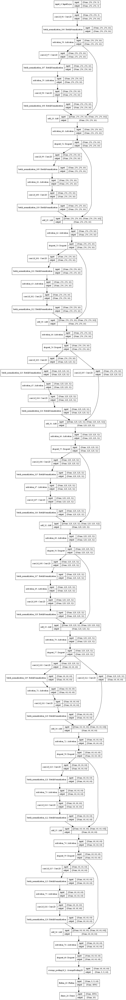

In [458]:
from tensorflow.keras.utils import  model_to_dot, plot_model
from IPython.display import SVG
import keras
import pydot
import pydotplus
from pydotplus import graphviz
from keras.utils.vis_utils import plot_model
from keras.utils.vis_utils import model_to_dot
keras.utils.vis_utils.pydot = pydot

SVG(model_to_dot(model_2).create(prog='dot', format='svg'))
plot_model(model_2, to_file='model_2_plot.png', show_shapes=True, show_layer_names=True, expand_nested=True)

In [449]:
model_type= 'ResNet'
save_dir = os.path.join(os.getcwd(), 'saved_models_with_dropout')
model_name = 'data_10_%s_model.{epoch:03d}.h5' % model_type
if not os.path.isdir(save_dir):
    os.makedirs(save_dir)
filepath = os.path.join(save_dir, model_name)

checkpoint = ModelCheckpoint(filepath=filepath,monitor='val_accuracy',verbose=1,save_best_only=True)
lr_scheduler = LearningRateScheduler(lr_schedule)
stopping = EarlyStopping(monitor='val_accuracy', patience=5)

In [754]:
# train the model
history = model_2.fit_generator(train_batches,
                        steps_per_epoch = train_batches.samples // batch_size,
                        validation_data = valid_batches,
                        validation_steps = valid_batches.samples // batch_size,
                        callbacks=[stopping, checkpoint, lr_scheduler],      
                        epochs = epochs)

Epoch 1/20
Learning rate:  0.001
45/45 [==============================] - 5371s 119s/step - loss: 3.8685 - accuracy: 0.1231 - val_loss: 2.2305 - val_accuracy: 0.1193

Epoch 00001: val_accuracy improved from -inf to 0.11932, saving model to C:\Users\PC\python\OpenClassrooms\Projet6\saved_models_with_dropout\data_10_ResNet_model.001.h5
Epoch 2/20
Learning rate:  0.001
45/45 [==============================] - 1065s 24s/step - loss: 2.4715 - accuracy: 0.1597 - val_loss: 3.8780 - val_accuracy: 0.1534

Epoch 00002: val_accuracy improved from 0.11932 to 0.15341, saving model to C:\Users\PC\python\OpenClassrooms\Projet6\saved_models_with_dropout\data_10_ResNet_model.002.h5
Epoch 3/20
Learning rate:  0.001
45/45 [==============================] - 1097s 24s/step - loss: 2.2922 - accuracy: 0.2139 - val_loss: 6.2708 - val_accuracy: 0.1136

Epoch 00003: val_accuracy did not improve from 0.15341
Epoch 4/20
Learning rate:  0.001
45/45 [==============================] - 996s 22s/step - loss: 2.1693 - 

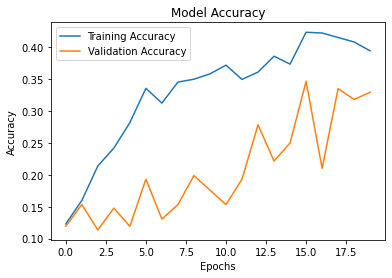

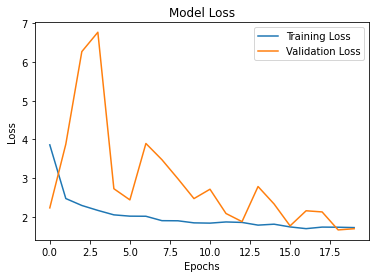

In [757]:
plt.subplot()
plt.title('Model Accuracy')
plt.plot(history.history['accuracy'])
plt.plot(history.history['val_accuracy'])
plt.ylabel('Accuracy')
plt.xlabel('Epochs')
plt.legend(['Training Accuracy','Validation Accuracy'])
plt.savefig('baseline_acc_epoch.png', transparent= False, bbox_inches= 'tight', dpi= 900)
plt.show()

plt.title('Model Loss')
plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.ylabel('Loss')
plt.xlabel('Epochs')
plt.legend(['Training Loss','Validation Loss'])
plt.savefig('baseline_loss_epoch.png', transparent= False, bbox_inches= 'tight', dpi= 900)
plt.show()

In [796]:
with open("./model.json", "w") as json_file:
  json_file.write(model_2.to_json())
  model_2.save_weights("./model_2_weights.h5")
  print("model saved model to disk")

model saved model to disk


In [793]:
TEST_DIR = test_dir+'/'

test_datagen = ImageDataGenerator(rescale = 1/255.0)


test_batches  = test_datagen.flow_from_directory(TEST_DIR,
                                               batch_size=1,
                                               class_mode='categorical',
                                                shuffle=False, 
                                              target_size=(img_height, img_width))
            
         

Found 100 images belonging to 10 classes.


In [794]:
Vloss_and_Vmetrics = model_2.evaluate(test_batches,  steps=test_batches.samples //1)

100/100 [==============================] - 25s 252ms/step


In [795]:
Vloss_and_Vmetrics

[0.37358948588371277, 0.3799999952316284]




<div class="alert alert-info" style="background-color:#5d3a8e; color:white; padding:0px 10px; border-radius:5px;"><h2 style='margin:10px 5px'>  Transfer Learning  </h2>
</div>



- The following chart shows how the data flows when using the Inception model for Transfer Learning. First we input and process an image with the Inception model. Just prior to the final classification layer of the Inception model, we save the so-called Transfer Values to a cache-file.

- The reason for using a cache-file is that it takes a long time to process an image with the Inception model. My laptop computer with a Quad-Core 2 GHz CPU can process about 3 images per second using the Inception model. If each image is processed more than once then we can save a lot of time by caching the transfer-values.

- The transfer-values are also sometimes called bottleneck-values, but that is a confusing term so it is not used here.

- When all the images in the new data-set have been processed through the Inception model and the resulting transfer-values saved to a cache file, then we can use those transfer-values as the input to another neural network. We will then train the second neural network using the classes from the new data-set, so the network learns how to classify images based on the transfer-values from the Inception model.

- In this way, the Inception model is used to extract useful information from the images and another neural network is then used for the actual classification.

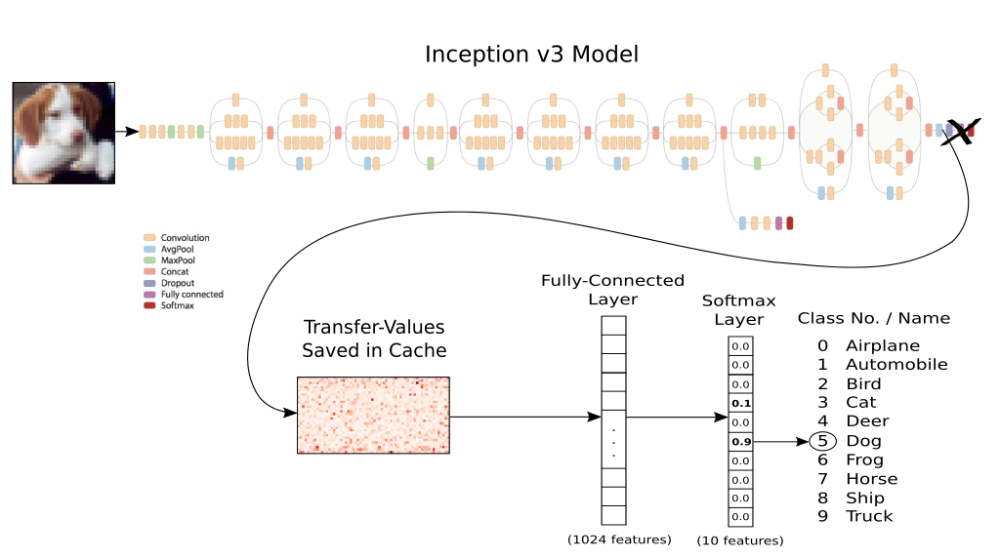

In [785]:
from IPython.display import Image, display
Image('08_transfer_learning_flowchart.png')


<div class="alert alert-info" style="background-color:#5d3a8e; color:white; padding:0px 10px; border-radius:5px;"><h2 style='margin:10px 5px'>  Transfer Learning with Inception V3  </h2>
</div>



- I have used the InceptionV3 CNN Model, which is pre-trained on the ImageNet dataset for classification. Data augementation has been used for making the model generalize better and also to avoid overfitting. The model achieved an accuracy of ? % on validation set, which is decent enough for this dataset

In [1001]:
from keras.models import Model
from keras.optimizers import Adam
from keras.layers import GlobalAveragePooling2D
from keras.layers import Dense
from keras.applications.inception_v3 import InceptionV3, preprocess_input
from keras.utils.np_utils import to_categorical
from keras.preprocessing.image import ImageDataGenerator

In [1002]:
img_width=299; 
img_height=299
def Preprocess_Input(img):
    img= (img * 255).astype(np.uint8)
    img= Histogram_Equalization(img)
    #img = tf.io.read_file(image_path)
    #img = tf.image.decode_jpeg(img, channels=3)
    #img = tf.image.resize(img, (299, 299))
    img = tf.keras.applications.inception_v3.preprocess_input(img)
    return img

In [1003]:
TRAINING_DIR = train_dir+'/'

train_datagen = ImageDataGenerator( preprocessing_function=preprocess_input,
                                    rescale = 1/255.0,
                                    rotation_range=30,
                                    zoom_range=0.1,
                                    horizontal_flip=True,
                                    width_shift_range=0.1,
                                    height_shift_range=0.1,
                                    shear_range=0.01,
                                    brightness_range=[0.8, 1.5])


train_batches  = train_datagen.flow_from_directory(TRAINING_DIR,
                                                    batch_size=batch_size,
                                                    class_mode='categorical',
                                                    color_mode= 'rgb',
                                                    target_size=(img_height, img_width),
                                                    )
                                     
# Create validation generator
VALIDATION_DIR = validation_dir+'/'

validation_datagen = ImageDataGenerator(
                                        rescale = 1/255.0)

valid_batches  = validation_datagen.flow_from_directory(VALIDATION_DIR,
                                                        batch_size=batch_size,
                                                        color_mode= 'rgb',
                                                        class_mode='categorical',
                                                        target_size=(img_height, img_width),
                                                          )

Found 1451 images belonging to 10 classes.
Found 368 images belonging to 10 classes.


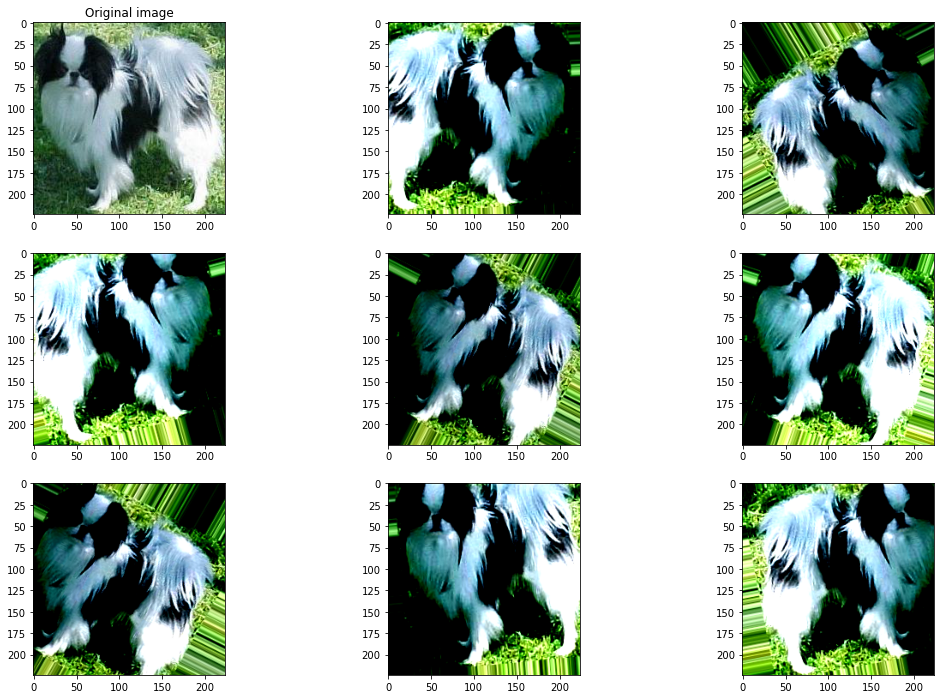

In [1006]:
from numpy import expand_dims
img= load_img(r'C:\Users\PC\python\OpenClassrooms\Projet6\data_10_Folder\train\n02085782-Japanese_spaniel\n02085782_2.jpg')
plt.figure(figsize= (18, 12))
plt.subplot(3, 3, 1)
plt.imshow(img, aspect=True)
plt.title('Original image')

data= img_to_array(img)
samples= expand_dims(data, 0)
it= train_datagen.flow(samples, batch_size= 1)

for i in range(8):
    plt.subplot(3, 3, i+2)
    #plt.subplot(330+1+i)
    batch=it.next()
    image= batch[0]
    Image = image/np.amax(image)
    Image = np.clip(Image, 0, 1)
    plt.imshow(Image)
plt.savefig('augmented_image_with_preprocess_input_inception.png', transparent=False, bbox_inches='tight', dpi=900)
plt.show()

In [860]:
# show class indices
print('****************')
for cls, idx in train_batches.class_indices.items():
    print('Class #{} = {}'.format(idx, cls))
print('****************')

****************
Class #0 = n02085620-Chihuahua
Class #1 = n02085782-Japanese_spaniel
Class #2 = n02085936-Maltese_dog
Class #3 = n02086079-Pekinese
Class #4 = n02086240-Shih-Tzu
Class #5 = n02086646-Blenheim_spaniel
Class #6 = n02086910-papillon
Class #7 = n02087046-toy_terrier
Class #8 = n02087394-Rhodesian_ridgeback
Class #9 = n02088094-Afghan_hound
****************


In [868]:
# Reduce Learning rate from 3 epochs
learning_rate_reduction = ReduceLROnPlateau(monitor='val_accuracy', patience=3, verbose=1, factor=0.5, min_lr=0.000001)

model_filename='classification_inception_v3_model_epochs.h5'
# Stop training when the val_accuracy metric has stopped improving from 5 epochs
stopping = EarlyStopping(monitor='val_accuracy', patience=5)
checkpointer = ModelCheckpoint(model_filename, #path to save the model file
                               verbose=1, 
                               save_best_only=True ,
                               save_weights_only=False, 
                               monitor='val_accuracy' , 
                               mode='max')

In [804]:
#Use for approximate the gradient during back-propagation
optimiseur= tf.keras.optimizers.RMSprop(
    learning_rate=0.001,
    rho=0.9,
    momentum=0.0,
    epsilon=1e-07,
    centered=False,
    name="RMSprop",
    **kwargs
)

# Get the InceptionV3 model:

In [869]:
# Get the InceptionV3 model so we can do transfer learning 
#  input_shape=(299, 299, 3) 
base_inception = InceptionV3(weights='imagenet',  input_shape= (img_width, img_height, 3), include_top=False)

In [870]:
# only if we want to freeze layers
for layer in base_inception.layers:
    layer.trainable = False

In [871]:
# Add a global spatial average pooling layer
out = base_inception.output
out = GlobalAveragePooling2D()(out)
out = Dense(512, activation='relu')(out)
predictions = Dense(num_classes, activation='softmax')(out)

model_InceptionV3 = Model(inputs=base_inception.input, outputs=predictions)

In [872]:
# Compile 
model_InceptionV3.compile(optimizer=Adam(lr=1e-5), loss='categorical_crossentropy', metrics=['accuracy'])

In [873]:
model_InceptionV3.summary()

Model: "model_6"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_8 (InputLayer)            (None, 299, 299, 3)  0                                            
__________________________________________________________________________________________________
conv2d_349 (Conv2D)             (None, 149, 149, 32) 864         input_8[0][0]                    
__________________________________________________________________________________________________
batch_normalization_365 (BatchN (None, 149, 149, 32) 96          conv2d_349[0][0]                 
__________________________________________________________________________________________________
activation_284 (Activation)     (None, 149, 149, 32) 0           batch_normalization_365[0][0]    
____________________________________________________________________________________________

In [874]:
SVG(model_to_dot(model_InceptionV3).create(prog='dot', format='svg'))
plot_model(model_InceptionV3, to_file='model_InceptionV3_plot.png', show_shapes=True, show_layer_names=True, expand_nested=True)

In [875]:
history = model_InceptionV3.fit_generator(train_batches,
                        steps_per_epoch = train_batches.samples // batch_size,
                        validation_data = valid_batches,
                        validation_steps = valid_batches.samples // batch_size,
                        callbacks=[stopping, checkpointer, learning_rate_reduction],      
                        epochs = 20)

Epoch 1/20
45/45 [==============================] - 682s 15s/step - loss: 2.2169 - accuracy: 0.1691 - val_loss: 2.1156 - val_accuracy: 0.3438

Epoch 00001: val_accuracy improved from -inf to 0.34375, saving model to classification_inception_v3_model_epochs.h5
Epoch 2/20
45/45 [==============================] - 769s 17s/step - loss: 2.0366 - accuracy: 0.3862 - val_loss: 1.8792 - val_accuracy: 0.6488

Epoch 00002: val_accuracy improved from 0.34375 to 0.64881, saving model to classification_inception_v3_model_epochs.h5
Epoch 3/20
45/45 [==============================] - 687s 15s/step - loss: 1.8891 - accuracy: 0.5300 - val_loss: 1.7019 - val_accuracy: 0.7738

Epoch 00003: val_accuracy improved from 0.64881 to 0.77381, saving model to classification_inception_v3_model_epochs.h5
Epoch 4/20
45/45 [==============================] - 988s 22s/step - loss: 1.7298 - accuracy: 0.6512 - val_loss: 1.3736 - val_accuracy: 0.8482

Epoch 00004: val_accuracy improved from 0.77381 to 0.84821, saving mode

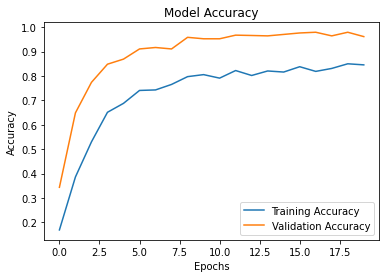

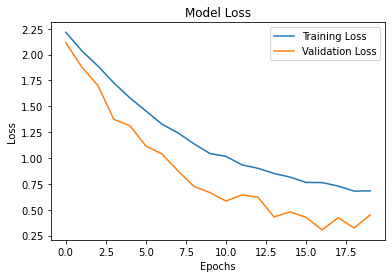

In [876]:
plt.subplot()
plt.title('Model Accuracy')
plt.plot(history.history['accuracy'])
plt.plot(history.history['val_accuracy'])
plt.ylabel('Accuracy')
plt.xlabel('Epochs')
plt.legend(['Training Accuracy','Validation Accuracy'])
plt.savefig('baseline_acc_epoch.png', transparent= False, bbox_inches= 'tight', dpi= 900)
plt.show()

plt.title('Model Loss')
plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.ylabel('Loss')
plt.xlabel('Epochs')
plt.legend(['Training Loss','Validation Loss'])
plt.savefig('baseline_loss_epoch.png', transparent= False, bbox_inches= 'tight', dpi= 900)
plt.show()

In [886]:

TEST_DIR = test_dir+'/'

test_datagen = ImageDataGenerator(rescale = 1/255.0)


test_batches  = test_datagen.flow_from_directory(TEST_DIR,
                                               batch_size=1,
                                               class_mode='categorical',
                                                shuffle=False, 
                                              target_size=(img_height, img_width))
            
         

Found 100 images belonging to 10 classes.


In [887]:
#model_InceptionV3.load_model('classification_inception_v3_model_epochs.h5')
from tensorflow.python.keras.models import load_model
# load the trained model
#model_InceptionV3 = load_model('classification_inception_v3_model_epochs.h5')
model_InceptionV3.load_weights('classification_inception_v3_model_epochs.h5')

In [888]:
Vloss_and_Vmetrics = model_InceptionV3.evaluate(test_batches,  steps=test_batches.samples // 1)

  ...
    to  
  ['...']
100/100 [==============================] - 25s 247ms/step - loss: 0.4272 - accuracy: 0.9100


In [889]:
Vloss_and_Vmetrics

[0.42723761539906263, 0.91]


<div class="alert alert-info" style="background-color:#5d3a8e; color:white; padding:0px 10px; border-radius:5px;"><h2 style='margin:10px 5px'>  Transfer Learning with VGG16  </h2>
</div>


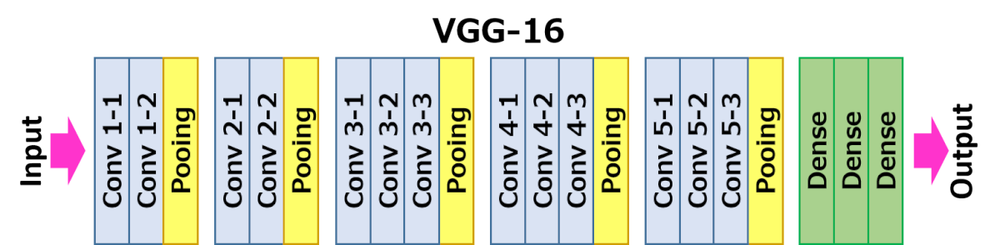

In [950]:
from IPython.display import Image, display
Image('vgg16.png')

In [910]:
#from tensorflow.keras.applications.efficientnet import EfficientNetB0, preprocess_input, decode_predictions
#from tensorflow.python.keras.applications.efficientnet import *
#from keras.applications import MobileNetV2 
from keras.applications.vgg16 import VGG16
from keras.applications.vgg16 import preprocess_input

In [908]:
checkpoint = ModelCheckpoint('VGG16_classifier.h5',
                             monitor='val_accuracy',
                             save_best_only=True,
                             verbose=1,
                             mode='auto',
                             save_weights_only=False,
                             period=1)
earlystop = EarlyStopping(monitor='val_accuracy',
                          min_delta=.0001,
                          patience=20,
                          verbose=1,
                          mode='auto',
                          baseline=None,
                          restore_best_weights=True)
reducelr = ReduceLROnPlateau(monitor='val_accuracy',
                             factor=np.sqrt(.1),
                             patience=5,
                             verbose=1,
                             mode='auto',
                             min_delta=.0001,
                             cooldown=0,
                             min_lr=0.0000001)

In [951]:
TRAINING_DIR = train_dir+'/'

train_datagen = ImageDataGenerator( preprocessing_function=preprocess_input,
                                    rescale = 1/255.0,
                                    rotation_range=30,
                                    zoom_range=0.1,
                                    horizontal_flip=True,
                                    width_shift_range=0.1,
                                    height_shift_range=0.1,
                                    shear_range=0.01,
                                    brightness_range=[0.8, 1.5])


train_batches  = train_datagen.flow_from_directory(TRAINING_DIR,
                                                    batch_size=batch_size,
                                                    class_mode='categorical',
                                                    color_mode= 'rgb',
                                                    target_size=(img_height, img_width),
                                                    )
                                     
# Create validation generator
VALIDATION_DIR = validation_dir+'/'

validation_datagen = ImageDataGenerator(
                                        rescale = 1/255.0)

valid_batches  = validation_datagen.flow_from_directory(VALIDATION_DIR,
                                                        batch_size=batch_size,
                                                        color_mode= 'rgb',
                                                        class_mode='categorical',
                                                        target_size=(img_height, img_width),
                                                          )

Found 1451 images belonging to 10 classes.
Found 368 images belonging to 10 classes.


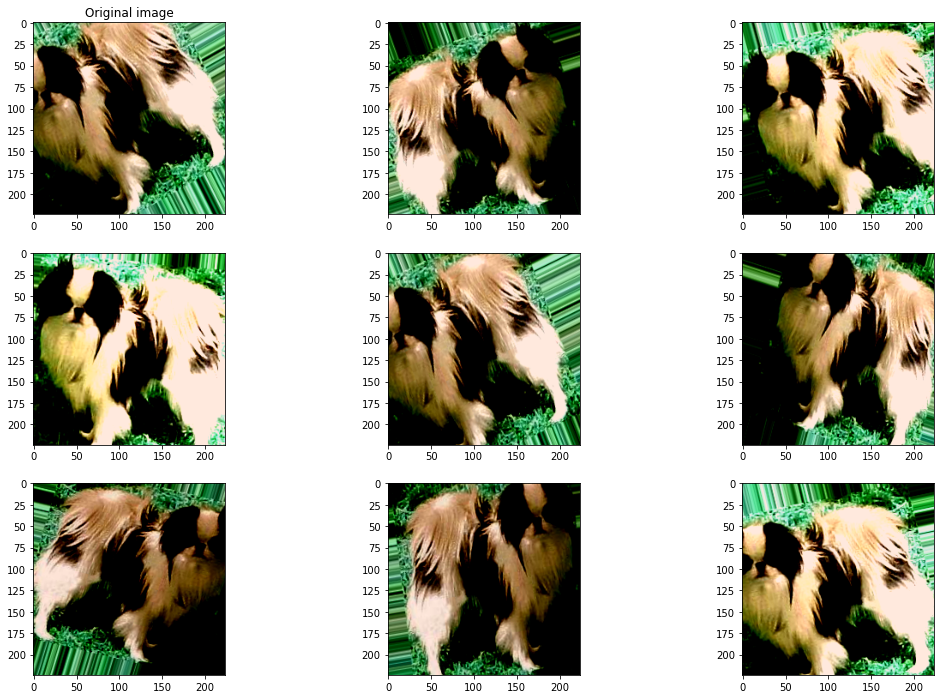

In [953]:
from numpy import expand_dims
img= load_img(r'C:\Users\PC\python\OpenClassrooms\Projet6\data_10_Folder\train\n02085782-Japanese_spaniel\n02085782_2.jpg')
plt.figure(figsize= (18, 12))
plt.subplot(3, 3, 1)
plt.imshow(img, aspect=True)
plt.title('Original image')

data= img_to_array(img)
samples= expand_dims(data, 0)
it= train_datagen.flow(samples, batch_size= 1)

for i in range(8):
    plt.subplot(3, 3, i+2)
    #plt.subplot(330+1+i)
    batch=it.next()
    image= batch[0]
    Image = image/np.amax(image)
    Image = np.clip(Image, 0, 1)
    plt.imshow(Image)
plt.savefig('augmented_image_with_preprocess_input_VGG16.png', transparent=False, bbox_inches='tight', dpi=900)
plt.show()

In [912]:
#base_model_EfficientNetB0 = EfficientNetB0(include_top=False, weights='imagenet',input_shape= (img_width, img_height, 3))
model_VGG16 = VGG16(include_top=False, input_shape=(img_width, img_height, 3),weights="imagenet")

In [913]:
# only if we want to freeze layers
for layer in model_VGG16.layers:
    layer.trainable = False

In [914]:
x = model_VGG16.output
x = GlobalAveragePooling2D()(x)
# x = Dropout(rate = .2)(x)
x = BatchNormalization()(x)
x = Dense(1280, activation='relu', bias_initializer='zeros')(x)
# x = Dropout(rate = .2)(x)
x = BatchNormalization()(x)
predictions = Dense(num_classes, activation='softmax', kernel_initializer='random_uniform', bias_initializer='zeros')(x)

In [915]:
model_VGG16 = Model(inputs=model_VGG16.input, outputs=predictions)

In [ ]:
#for layer in model_EfficientNetB0.layers:
#    layer.trainable = True

In [916]:
model_VGG16.compile(optimizer=Adam(lr=1e-5), loss='categorical_crossentropy', metrics=['accuracy'])
model_VGG16.summary()

Model: "model_8"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_10 (InputLayer)        (None, 299, 299, 3)       0         
_________________________________________________________________
block1_conv1 (Conv2D)        (None, 299, 299, 64)      1792      
_________________________________________________________________
block1_conv2 (Conv2D)        (None, 299, 299, 64)      36928     
_________________________________________________________________
block1_pool (MaxPooling2D)   (None, 149, 149, 64)      0         
_________________________________________________________________
block2_conv1 (Conv2D)        (None, 149, 149, 128)     73856     
_________________________________________________________________
block2_conv2 (Conv2D)        (None, 149, 149, 128)     147584    
_________________________________________________________________
block2_pool (MaxPooling2D)   (None, 74, 74, 128)       0   

In [ ]:
for i, layer in enumerate(model_VGG16.layers):
    print(i, layer.name, layer.trainable)

In [917]:
# train the model
history_VGG16 = model_VGG16.fit_generator(train_batches,
                        steps_per_epoch = train_batches.samples // batch_size,
                        validation_data = valid_batches,
                        validation_steps = valid_batches.samples // batch_size,
                        callbacks=[earlystop , checkpoint, reducelr ],      
                        epochs = 20)

Epoch 1/20
45/45 [==============================] - 1730s 38s/step - loss: 2.5546 - accuracy: 0.1388 - val_loss: 2.2808 - val_accuracy: 0.1136

Epoch 00001: val_accuracy did not improve from 0.28409
Epoch 2/20
45/45 [==============================] - 1458s 32s/step - loss: 2.3100 - accuracy: 0.2185 - val_loss: 2.2903 - val_accuracy: 0.1280

Epoch 00002: val_accuracy did not improve from 0.28409
Epoch 3/20
45/45 [==============================] - 10084s 224s/step - loss: 2.0940 - accuracy: 0.2889 - val_loss: 2.2211 - val_accuracy: 0.1756

Epoch 00003: val_accuracy did not improve from 0.28409
Epoch 4/20
45/45 [==============================] - 1635s 36s/step - loss: 1.9152 - accuracy: 0.3411 - val_loss: 2.1228 - val_accuracy: 0.1935

Epoch 00004: val_accuracy did not improve from 0.28409
Epoch 5/20
45/45 [==============================] - 1539s 34s/step - loss: 1.7727 - accuracy: 0.4080 - val_loss: 2.1343 - val_accuracy: 0.2857

Epoch 00005: val_accuracy improved from 0.28409 to 0.28571

In [30]:
def plot_accuracy_and_loss(hist):
    fig, axs = plt.subplots(1, 2, figsize=(15, 5))
    axs[0].plot(hist.history["accuracy"], label="Training accuracy")
    axs[0].plot(hist.history["val_accuracy"], label="Validation accuracy")
    axs[0].set_title("Training and validation accuracy")
    axs[0].legend()

    axs[1].plot(hist.history["loss"], label="Training loss")
    axs[1].plot(hist.history["val_loss"], label="Validation loss")
    axs[1].set_title("Training and validation loss")
    axs[1].legend()

    plt.show()


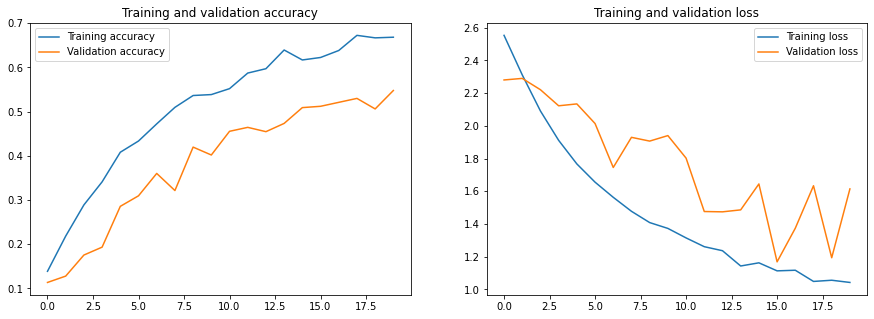

In [964]:
plot_accuracy_and_loss(history_VGG16)

In [974]:
def plot_smoothed_acc_and_loss(history, factor=0.8):
    fig, axs = plt.subplots(1, 2, figsize=(15, 5))
    axs[0].plot(
        smooth_curve(history.history["accuracy"], factor=factor), label="Training accuracy"
    )
    axs[0].plot(
        smooth_curve(history.history["val_accuracy"], factor=factor),
        label="Validation accuracy",
    )
    axs[0].set_title("Smoothed training and validation accuracy")
    axs[0].legend()

    axs[1].plot(
        smooth_curve(history.history["loss"], factor=factor), label="Training loss"
    )
    axs[1].plot(
        smooth_curve(history.history["val_loss"], factor=factor),
        label="Validation loss",
    )
    axs[1].set_title("Smoothed training and validation loss")
    axs[1].legend()

    plt.show()
    
    
def smooth_curve(points, factor=0.8):
    smoothed_points = []
    for point in points:
        if smoothed_points:
            previous = smoothed_points[-1]
            smoothed_points.append(previous * factor + point * (1 - factor))
        else:
            smoothed_points.append(point)
    return smoothed_points    

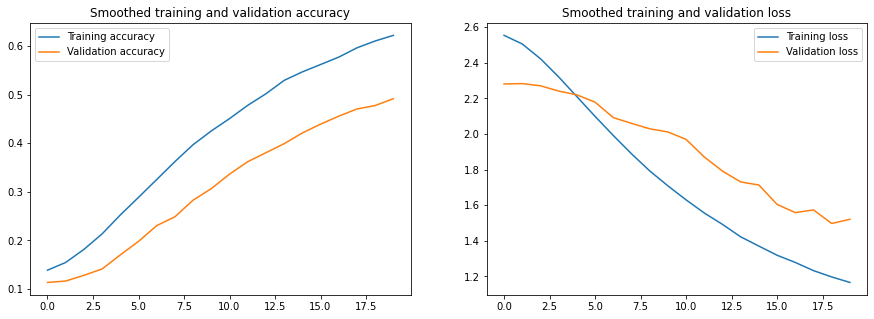

In [975]:
plot_smoothed_acc_and_loss(history_VGG16, 0.8)

In [941]:
TEST_DIR = test_dir+'/'

test_datagen = ImageDataGenerator(rescale = 1/255.0)


test_batches  = train_datagen.flow_from_directory(TEST_DIR,
                                                    batch_size=1,
                                                    class_mode='categorical',
                                                   
                                                    target_size=(img_height, img_width))


Found 100 images belonging to 10 classes.


In [981]:
model_VGG16= load_model('MobileNetV2_classifier.h5')
model_VGG16.load_weights('MobileNetV2_classifier.h5')

In [983]:
Vloss_and_Vmetrics = model_VGG16.evaluate(test_batches,  steps = test_batches.samples // 1)

  ...
    to  
  ['...']
100/100 [==============================] - 110s 1s/step - loss: 0.9720 - accuracy: 0.6700


In [984]:
Vloss_and_Vmetrics

[0.9720426667202264, 0.67]

<div class="alert alert-info" style="background-color:#5d3a8e; color:white; padding:0px 10px; border-radius:5px;"><h2 style='margin:10px 5px'>  Transfer Learning with Xception  </h2>
</div>


In [985]:
from keras.applications.xception import Xception

In [986]:
checkpoint = ModelCheckpoint('Xception_classifier.h5',
                             monitor='val_accuracy',
                             save_best_only=True,
                             verbose=1,
                             mode='auto',
                             save_weights_only=False,
                             period=1)
earlystop = EarlyStopping(monitor='val_accuracy',
                          min_delta=.0001,
                          patience=20,
                          verbose=1,
                          mode='auto',
                          baseline=None,
                          restore_best_weights=True)
reducelr = ReduceLROnPlateau(monitor='val_accuracy',
                             factor=np.sqrt(.1),
                             patience=5,
                             verbose=1,
                             mode='auto',
                             min_delta=.0001,
                             cooldown=0,
                             min_lr=0.0000001)

In [987]:
TRAINING_DIR = train_dir+'/'

train_datagen = ImageDataGenerator(
                                    rescale = 1/255.0,
                                    rotation_range=30,
                                    zoom_range=0.1,
                                    horizontal_flip=True,
                                    width_shift_range=0.1,
                                    height_shift_range=0.1,
                                    shear_range=0.01,
                                    brightness_range=[0.8, 1.5])


train_batches  = train_datagen.flow_from_directory(TRAINING_DIR,
                                                    batch_size=batch_size,
                                                    class_mode='categorical',
                                                    color_mode= 'rgb',
                                                    target_size=(img_height, img_width),
                                                    )
                                     
# Create validation generator
VALIDATION_DIR = validation_dir+'/'

validation_datagen = ImageDataGenerator(
                                        rescale = 1/255.0)

valid_batches  = validation_datagen.flow_from_directory(VALIDATION_DIR,
                                                        batch_size=batch_size,
                                                        color_mode= 'rgb',
                                                        class_mode='categorical',
                                                        target_size=(img_height, img_width),
                                                          )

Found 1451 images belonging to 10 classes.
Found 368 images belonging to 10 classes.


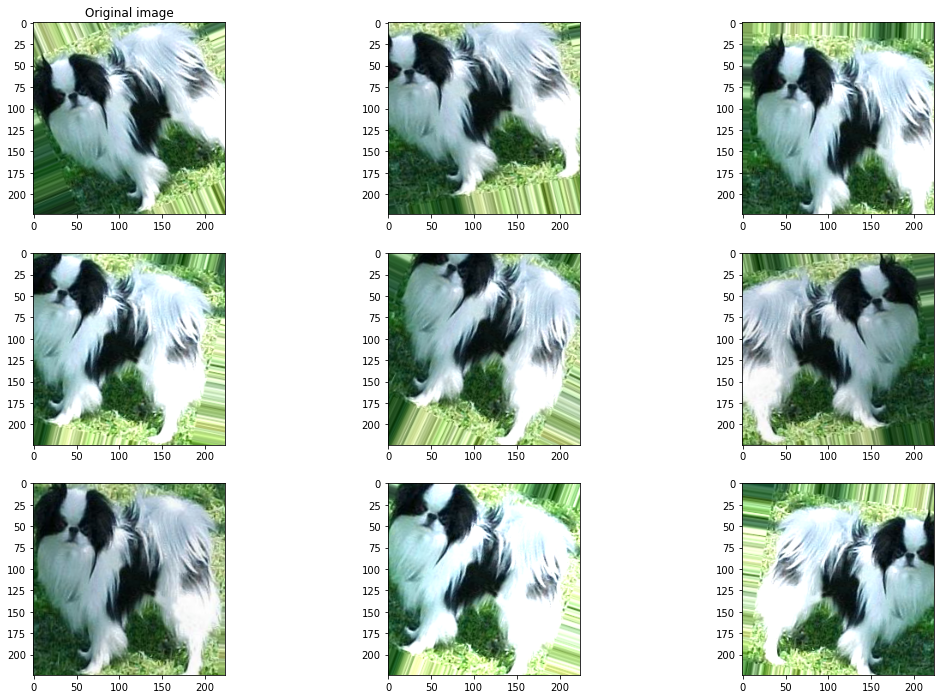

In [988]:
from numpy import expand_dims
img= load_img(r'C:\Users\PC\python\OpenClassrooms\Projet6\data_10_Folder\train\n02085782-Japanese_spaniel\n02085782_2.jpg')
plt.figure(figsize= (18, 12))
plt.subplot(3, 3, 1)
plt.imshow(img, aspect=True)
plt.title('Original image')

data= img_to_array(img)
samples= expand_dims(data, 0)
it= train_datagen.flow(samples, batch_size= 1)

for i in range(8):
    plt.subplot(3, 3, i+2)
    #plt.subplot(330+1+i)
    batch=it.next()
    image= batch[0]
    Image = image/np.amax(image)
    Image = np.clip(Image, 0, 1)
    plt.imshow(Image)
plt.savefig('augmented_image_with_preprocess_input_VGG16.png', transparent=False, bbox_inches='tight', dpi=900)
plt.show()

In [989]:
model_Xception = Xception(include_top=False, input_shape=(img_width, img_height, 3),weights="imagenet")

83689472/83683744 [==============================] - 2s 0us/step


In [990]:
# only if we want to freeze layers
for layer in model_Xception.layers:
    layer.trainable = False

In [991]:
x = model_Xception.output
x = GlobalAveragePooling2D()(x)
# x = Dropout(rate = .2)(x)
x = BatchNormalization()(x)
x = Dense(1280, activation='relu', bias_initializer='zeros')(x)
# x = Dropout(rate = .2)(x)
x = BatchNormalization()(x)
predictions = Dense(num_classes, activation='softmax', kernel_initializer='random_uniform', bias_initializer='zeros')(x)

In [992]:
model_Xception = Model(inputs=model_Xception.input, outputs=predictions)

In [993]:
model_Xception.compile(optimizer=Adam(lr=1e-5), loss='categorical_crossentropy', metrics=['accuracy'])
model_Xception.summary()

Model: "model_9"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_11 (InputLayer)           (None, 299, 299, 3)  0                                            
__________________________________________________________________________________________________
block1_conv1 (Conv2D)           (None, 149, 149, 32) 864         input_11[0][0]                   
__________________________________________________________________________________________________
block1_conv1_bn (BatchNormaliza (None, 149, 149, 32) 128         block1_conv1[0][0]               
__________________________________________________________________________________________________
block1_conv1_act (Activation)   (None, 149, 149, 32) 0           block1_conv1_bn[0][0]            
____________________________________________________________________________________________

In [994]:
# train the model
history_Xception = model_Xception.fit_generator(train_batches,
                        steps_per_epoch = train_batches.samples // batch_size,
                        validation_data = valid_batches,
                        validation_steps = valid_batches.samples // batch_size,
                        callbacks=[earlystop , checkpoint, reducelr ],      
                        epochs = 20)

Epoch 1/20
45/45 [==============================] - 1375s 31s/step - loss: 1.7755 - accuracy: 0.4271 - val_loss: 2.0405 - val_accuracy: 0.7500

Epoch 00001: val_accuracy improved from -inf to 0.75000, saving model to Xception_classifier.h5
Epoch 2/20
45/45 [==============================] - 1354s 30s/step - loss: 0.9243 - accuracy: 0.7519 - val_loss: 1.6263 - val_accuracy: 0.8839

Epoch 00002: val_accuracy improved from 0.75000 to 0.88393, saving model to Xception_classifier.h5
Epoch 3/20
45/45 [==============================] - 1391s 31s/step - loss: 0.6223 - accuracy: 0.8407 - val_loss: 1.3045 - val_accuracy: 0.9167

Epoch 00003: val_accuracy improved from 0.88393 to 0.91667, saving model to Xception_classifier.h5
Epoch 4/20
45/45 [==============================] - 1331s 30s/step - loss: 0.5168 - accuracy: 0.8576 - val_loss: 1.0000 - val_accuracy: 0.9315

Epoch 00004: val_accuracy improved from 0.91667 to 0.93155, saving model to Xception_classifier.h5
Epoch 5/20
45/45 [=============

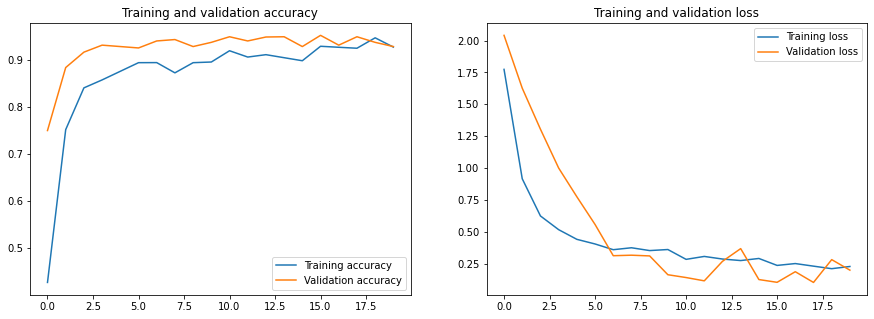

In [995]:
plot_accuracy_and_loss(history_Xception)

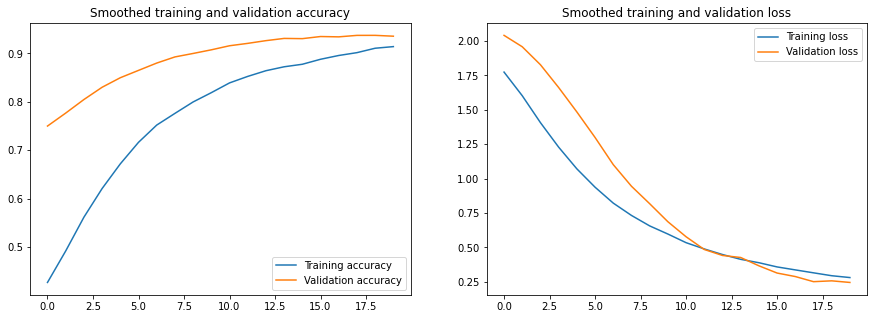

In [996]:
plot_smoothed_acc_and_loss(history_Xception, 0.8)

In [997]:
TEST_DIR = test_dir+'/'

test_datagen = ImageDataGenerator(rescale = 1/255.0)


test_batches  = train_datagen.flow_from_directory(TEST_DIR,
                                                    batch_size=1,
                                                    class_mode='categorical',
                                                   
                                                    target_size=(img_height, img_width))


Found 100 images belonging to 10 classes.


In [998]:
model_Xception.load_weights('Xception_classifier.h5')

In [999]:
Vloss_and_Vmetrics = model_Xception.evaluate(test_batches,  steps = test_batches.samples // 1)

100/100 [==============================] - 53s 529ms/step


In [1000]:
Vloss_and_Vmetrics

[0.004646101035177708, 0.9100000262260437]


<div class="alert alert-info" style="background-color:#5d3a8e; color:white; padding:0px 10px; border-radius:5px;"><h2 style='margin:10px 5px'>  Transfer Learning with Ixception V3 on 120 classes  </h2>
</div>

In [43]:
root_images = 'C:/Users/PC/python/OpenClassrooms/Projet6/Images/'  # Images folder
root_annotation = 'C:/Users/PC/python/OpenClassrooms/Projet6/Annotation/' # Annotation xml folder
root_data= 'C:/Users/PC/python/OpenClassrooms/Projet6/Data/'
#root_data_10= 'C:/Users/PC/python/OpenClassrooms/Projet6/Data_10_Folder/'
base_dir= 'C:/Users/PC/python/OpenClassrooms/Projet6/image_crop_Folder'

In [44]:
data = pd.read_pickle(r'C:/Users/PC/python/OpenClassrooms/Projet6/Data/data.pkl')
test_df = pd.read_pickle(r'C:/Users/PC/python/OpenClassrooms/Projet6/Data/test_df.pkl')
train_df = pd.read_pickle(r'C:/Users/PC/python/OpenClassrooms/Projet6/Data/train_df.pkl')
valid_df = pd.read_pickle(r'C:/Users/PC/python/OpenClassrooms/Projet6/Data/valid_df.pkl')


In [45]:
test_dir= 'C:/Users/PC/python/OpenClassrooms/Projet6/data_Folder/test'
train_dir= 'C:/Users/PC/python/OpenClassrooms/Projet6/data_Folder/train'
valid_dir= 'C:/Users/PC/python/OpenClassrooms/Projet6/data_Folder/validation'

In [46]:
from keras.applications import inception_v3
from keras.applications.inception_v3 import InceptionV3
from keras.applications.inception_v3 import preprocess_input 

STD_SIZE = (299, 299)
BATCH_SIZE = 20

In [47]:
TRAINING_DIR = train_dir+'/'
VALIDATION_DIR = valid_dir+'/'
TEST_DIR= test_dir+ '/'

# See what the preprocess_input does

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Text(0.5, 1.0, 'Inception V3_Input_Process of image')

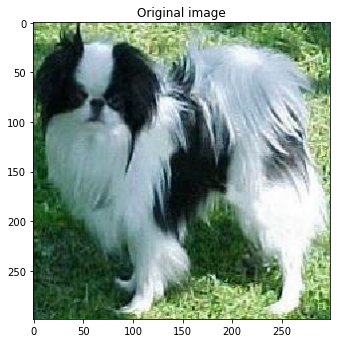

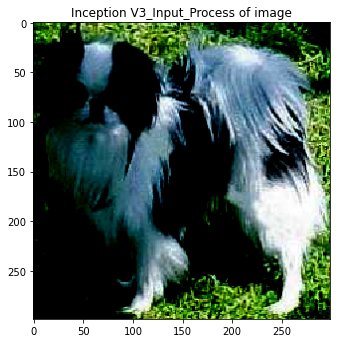

In [48]:
img= load_img(r'C:\Users\PC\python\OpenClassrooms\Projet6\data_10_Folder\train\n02085782-Japanese_spaniel\n02085782_2.jpg', target_size=(299, 299))
plt.figure(figsize= (18, 12))
plt.subplot(2, 1, 1)
plt.imshow(img, aspect=True)
plt.title('Original image')

img = img_to_array(img)  # Convertir en tableau numpy
img = img.reshape(( img.shape[0], img.shape[1], img.shape[2]))  # Créer la collection d'images (un seul échantillon)
img = preprocess_input(img)  # Prétraiter l'image comme le veut Inception V3
plt.figure(figsize= (18, 12))
plt.subplot(2, 2, 2)
plt.imshow(img, aspect=True)
plt.title('Inception V3_Input_Process of image')

In [49]:
train_datagen = ImageDataGenerator(preprocessing_function=preprocess_input,
    rescale=1/255,
    rotation_range=30,
    width_shift_range=0.2,
    height_shift_range=0.2,
    shear_range=0.2,
    zoom_range=0.1,
    horizontal_flip=True,
    fill_mode='nearest'
)
test_datagen = ImageDataGenerator(rescale=1/255)

train_generator = train_datagen.flow_from_directory(
    TRAINING_DIR,
    target_size=STD_SIZE,
    batch_size=BATCH_SIZE,
    class_mode='categorical')

validation_generator = test_datagen.flow_from_directory(
    VALIDATION_DIR,
    target_size=STD_SIZE,
    batch_size=BATCH_SIZE,
    class_mode='categorical')

test_generator = test_datagen.flow_from_directory(
    TEST_DIR,
    target_size=STD_SIZE,
    batch_size=BATCH_SIZE,
    class_mode='categorical')

Found 15551 images belonging to 120 classes.
Found 3952 images belonging to 120 classes.
Found 1077 images belonging to 120 classes.


In [52]:
# Get class labels
inv_class_indices = {v: k for k, v in train_generator.class_indices.items()}
classes_labels = []
for i in range(len(inv_class_indices)):
    classes_labels.append(inv_class_indices[i])
    

# Open a file and use dump()
with open('classes_encoding_120.pkl', 'wb') as file:
      
    # A new file will be created
    pickle.dump(classes_labels, file)
print('\nStored classes labels in classes_labels: ', classes_labels)




Stored classes labels in classes_labels:  ['n02085620-Chihuahua', 'n02085782-Japanese_spaniel', 'n02085936-Maltese_dog', 'n02086079-Pekinese', 'n02086240-Shih-Tzu', 'n02086646-Blenheim_spaniel', 'n02086910-papillon', 'n02087046-toy_terrier', 'n02087394-Rhodesian_ridgeback', 'n02088094-Afghan_hound', 'n02088238-basset', 'n02088364-beagle', 'n02088466-bloodhound', 'n02088632-bluetick', 'n02089078-black-and-tan_coonhound', 'n02089867-Walker_hound', 'n02089973-English_foxhound', 'n02090379-redbone', 'n02090622-borzoi', 'n02090721-Irish_wolfhound', 'n02091032-Italian_greyhound', 'n02091134-whippet', 'n02091244-Ibizan_hound', 'n02091467-Norwegian_elkhound', 'n02091635-otterhound', 'n02091831-Saluki', 'n02092002-Scottish_deerhound', 'n02092339-Weimaraner', 'n02093256-Staffordshire_bullterrier', 'n02093428-American_Staffordshire_terrier', 'n02093647-Bedlington_terrier', 'n02093754-Border_terrier', 'n02093859-Kerry_blue_terrier', 'n02093991-Irish_terrier', 'n02094114-Norfolk_terrier', 'n020942

In [16]:
def extract_features(generator, feature_size, batch_size, n_classes, model=None):
    features = np.zeros(shape=(generator.n, feature_size[0], feature_size[1], feature_size[2]))
    if n_classes > 2:
        labels = np.zeros(shape=(generator.n, n_classes))
    else: 
        labels = np.zeros(shape=(generator.n))
    i = 0 
    for inputs_batch, labels_batch in generator:
        if model:
            features_batch = model.predict(inputs_batch)
        else:
            features_batch = inputs_batch
        if generator.batch_index != 0:
            features[i * batch_size : (i + 1) * batch_size] = features_batch
            labels[i * batch_size : (i+ 1) * batch_size] = labels_batch
        elif generator.batch_index == 0:
            features[i * batch_size:] = features_batch
            labels[i * batch_size:] = labels_batch
        i += 1
        if i * batch_size >= generator.n:
            break
    return features, labels


In [18]:
# Load test images and labels
test_features, test_labels = extract_features(
    generator=test_generator, 
    feature_size=(STD_SIZE[0], STD_SIZE[1], 3), 
    batch_size=BATCH_SIZE, 
    n_classes=len(classes_labels))
print(f"\nLoaded test images in test_features array: {test_features.shape}")


Loaded test images in test_features array: (1077, 299, 299, 3)


In [20]:
conv_base = InceptionV3(weights='imagenet', 
                  include_top = False,
                  input_shape = (STD_SIZE[0], STD_SIZE[1], 3))

In [22]:
conv_base.summary()

Model: "inception_v3"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_1 (InputLayer)            (None, 299, 299, 3)  0                                            
__________________________________________________________________________________________________
conv2d_1 (Conv2D)               (None, 149, 149, 32) 864         input_1[0][0]                    
__________________________________________________________________________________________________
batch_normalization_1 (BatchNor (None, 149, 149, 32) 96          conv2d_1[0][0]                   
__________________________________________________________________________________________________
activation_1 (Activation)       (None, 149, 149, 32) 0           batch_normalization_1[0][0]      
_______________________________________________________________________________________

In [24]:
model = Sequential()
model.add(conv_base)
model.add(Flatten())
model.add(Dense(512, activation='relu'))
model.add(Dense(len(classes_labels), activation='softmax'))

conv_base.trainable = False

model.compile(loss='categorical_crossentropy',
              optimizer=RMSprop(lr=1e-4),
              metrics=['accuracy'])

In [27]:
PATH= 'C:/Users/PC/python/OpenClassrooms/Projet6'
history = model.fit_generator(
    train_generator, 
    steps_per_epoch=train_generator.n // BATCH_SIZE, 
    epochs=100, 
    verbose=1,
    validation_data=validation_generator, 
    validation_steps=validation_generator.n // BATCH_SIZE, 
    callbacks=[History(),
               ModelCheckpoint(PATH + 'tl_freeze_conv_base_inceptV3_data_aug_120_breeds', monitor='val_loss', save_best_only=True, verbose=1),
               EarlyStopping(monitor='val_loss', patience=5, restore_best_weights=True, verbose=1)
              ])

Epoch 1/100
777/777 [==============================] - 6485s 8s/step - loss: 2.8519 - accuracy: 0.4005 - val_loss: 0.4381 - val_accuracy: 0.7952

Epoch 00001: val_loss improved from inf to 0.43813, saving model to C:/Users/PC/python/OpenClassrooms/Projet6tl_freeze_conv_base_inceptV3_data_aug_120_breeds
Epoch 2/100
777/777 [==============================] - 6728s 9s/step - loss: 1.8334 - accuracy: 0.5579 - val_loss: 0.3413 - val_accuracy: 0.8400

Epoch 00002: val_loss improved from 0.43813 to 0.34127, saving model to C:/Users/PC/python/OpenClassrooms/Projet6tl_freeze_conv_base_inceptV3_data_aug_120_breeds
Epoch 3/100
777/777 [==============================] - 8669s 11s/step - loss: 1.6739 - accuracy: 0.6004 - val_loss: 0.2595 - val_accuracy: 0.8431

Epoch 00003: val_loss improved from 0.34127 to 0.25955, saving model to C:/Users/PC/python/OpenClassrooms/Projet6tl_freeze_conv_base_inceptV3_data_aug_120_breeds
Epoch 4/100
777/777 [==============================] - 6300s 8s/step - loss: 1.

In [28]:
model.evaluate(test_features, test_labels, batch_size=BATCH_SIZE)

1077/1077 [==============================] - 295s 274ms/step


[0.691722157903313, 0.8310120701789856]

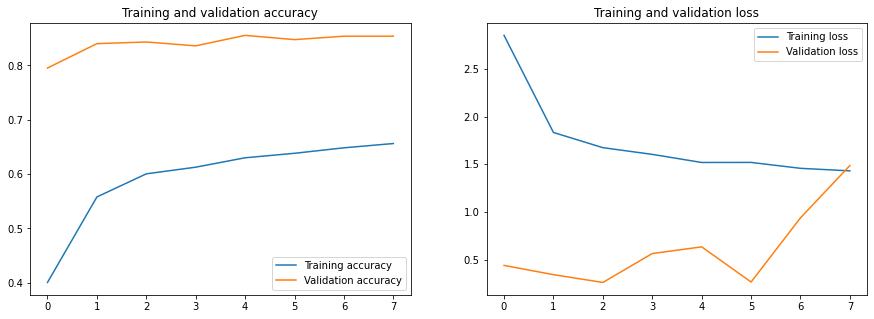

In [31]:
plot_accuracy_and_loss(history)

In [ ]:
y_true=np.argmax(test_labels, axis=-1)
y_pred=model.predict_classes(test_features)
confusion_mtx = confusion_matrix(y_true, y_pred) 


Confusion matrix, without normalization


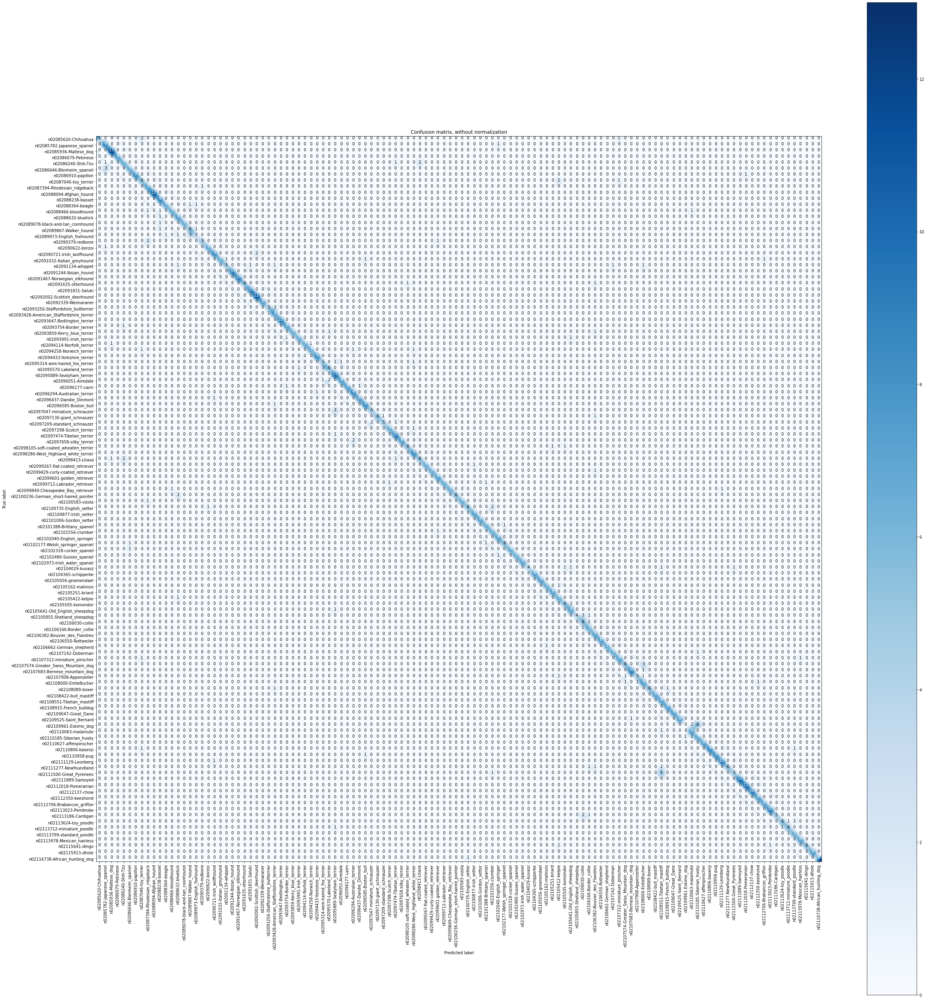

In [35]:
# Plot normalized confusion matrix
fig = plt.figure()
fig.set_size_inches(35, 35, forward=True)
fig.align_labels()

fig.subplots_adjust(left=0.0, right=1.0, bottom=0.0, top=1.0)
plot_confusion_matrix(confusion_mtx, 
                      classes=classes_labels, title='Confusion matrix, without normalization')
plt.show()



<div class="alert alert-info" style="background-color:#5d3a8e; color:white; padding:0px 10px; border-radius:5px;"><h2 style='margin:10px 5px'>  Prediction on one image:  </h2>
</div>

In [4]:
import sys
import cv2
import pickle
import numpy as np
from keras.models import load_model

import tensorflow as tf
       

In [3]:
model = load_model('Projet6tl_freeze_conv_base_inceptV3_data_aug_120_breeds')

In [7]:
with open('classes_encoding_120.pkl', 'rb') as f:
        classes_labels = pickle.load(f)

Text(0.5, 1.0, 'Original image')

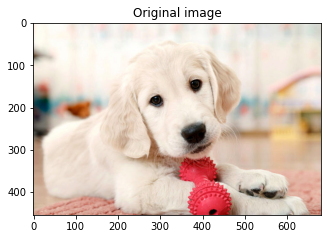

In [16]:
image_path=r'C:\Users\PC\python/OpenClassrooms/Projet6/IMG2.jpg'
height= 299
width=299

img= load_img(image_path)
plt.figure(figsize= (18, 12))
plt.subplot(3, 3, 1)
plt.imshow(img, aspect=True)
plt.title('Original image')

In [17]:
img = cv2.imread(image_path)
img = cv2.resize(img, (int(height), int(width)))
img = np.reshape(img, (-1, int(height), int(width), 3)) / 255



In [18]:
label = classes_labels[model.predict_classes(img)[0]]
print(f"\n\nPredicted breed: {label}")



Predicted breed: n02099601-golden_retriever


In [5]:
def PREDICT(image_path, height, width):
    
    img= load_img(image_path)
    plt.figure(figsize= (18, 12))
    plt.subplot(3, 3, 1)
    plt.imshow(img, aspect=True)
    plt.title('Original image')
    
    model = load_model('Projet6tl_freeze_conv_base_inceptV3_data_aug_120_breeds')
    with open('classes_encoding_120.pkl', 'rb') as f:
        classes_labels = pickle.load(f)
        

    img = cv2.imread(image_path)
    img = cv2.resize(img, (int(height), int(width)))
    img = np.reshape(img, (-1, int(height), int(width), 3)) / 255


    label = classes_labels[model.predict_classes(img)[0]]
    print(f"\n\nPredicted breed: {label}")

In [ ]:
from keras.models import  load_model

image_path=r'C:\Users\PC\python/OpenClassrooms/Projet6/57-english-toy-terrier.jpg'
height= 299
width=299

PREDICT(image_path, height, width)